# Аналитика рынка недвижимости Санкт-Петербурга

<h1>Содержание<span class="tocSkip"></span></h1>

<div class="toc"><ul class="toc-item"><li><span><a href="#Обзор-данных" data-toc-modified-id="Обзор-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Обзор данных</a></span></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Предобработка данных</a></span><ul class="toc-item"><li><span><a href="#Обработка-пропусков" data-toc-modified-id="Обработка-пропусков-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Обработка пропусков</a></span></li><li><span><a href="#Изменение-типов-данных" data-toc-modified-id="Изменение-типов-данных-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Изменение типов данных</a></span></li><li><span><a href="#Обработка-дубликатов" data-toc-modified-id="Обработка-дубликатов-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Обработка дубликатов</a></span></li><li><span><a href="#Обработка-аномальных-значений" data-toc-modified-id="Обработка-аномальных-значений-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Обработка аномальных значений</a></span></li><li><span><a href="#Обработка-пропусков-(продолжение)" data-toc-modified-id="Обработка-пропусков-(продолжение)-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Обработка пропусков (продолжение)</a></span></li><li><span><a href="#Добавление-новых-столбцов" data-toc-modified-id="Добавление-новых-столбцов-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Добавление новых столбцов</a></span></li></ul></li><li><span><a href="#Исследовательский-анализ-данных" data-toc-modified-id="Исследовательский-анализ-данных-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Исследовательский анализ данных</a></span><ul class="toc-item"><li><span><a href="#Изучение-параметров-объекта" data-toc-modified-id="Изучение-параметров-объекта-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Изучение параметров объекта</a></span></li><li><span><a href="#Изучение-скорости-продаж-квартиры" data-toc-modified-id="Изучение-скорости-продаж-квартиры-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Изучение скорости продаж квартиры</a></span></li><li><span><a href="#Изучение-влияния-различных-факторов-на-стоимость-объекта-недвижимости" data-toc-modified-id="Изучение-влияния-различных-факторов-на-стоимость-объекта-недвижимости-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Изучение влияния различных факторов на стоимость объекта недвижимости</a></span></li><li><span><a href="#Расчет-средней-цены-одного-квадратного-метра" data-toc-modified-id="Расчет-средней-цены-одного-квадратного-метра-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Расчет средней цены одного квадратного метра</a></span></li><li><span><a href="#Изучение-влияния-удаленности-от-центра-Санкт-Петербурга-на-стоимость-квартир" data-toc-modified-id="Изучение-влияния-удаленности-от-центра-Санкт-Петербурга-на-стоимость-квартир-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Изучение влияния удаленности от центра Санкт-Петербурга на стоимость квартир</a></span></li></ul></li><li><span><a href="#Общий-вывод" data-toc-modified-id="Общий-вывод-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Общий вывод</a></span></li></ul></div>

## Обзор данных

Загрузим полученные для анализа данные и рассмотрим общую информацию по ним.

In [1]:
# Подключаем библиотеки для анализа
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np

# Подключаем библиотеки для визуализации
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# Подключаем модуль для работы с файлом
from pathlib import Path

In [2]:
# Получаем строку, содержащую путь к рабочей директории
work_path = Path.cwd()

# сохраним путь к csv файлу в переменной data_path 
data_path = Path(work_path, 'datasets', 'real_estate_data.csv')
 
# Загружаем данные из csv файла в переменную data
data = pd.read_csv(data_path, sep='\t')
pd.set_option('display.max_columns', None)

# Выведем первые 10 строк
data.head(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.00,2019-03-07T00:00:00,3,2.70,16.0,51.00,8,NaN,False,False,25.00,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000.0,40.40,2018-12-04T00:00:00,1,NaN,11.0,18.60,1,NaN,False,False,11.00,2.0,посёлок Шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
2,10,5196000.0,56.00,2015-08-20T00:00:00,2,NaN,5.0,34.30,4,NaN,False,False,8.30,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000.0,159.00,2015-07-24T00:00:00,3,NaN,14.0,NaN,9,NaN,False,False,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000.0,100.00,2018-06-19T00:00:00,2,3.03,14.0,32.00,13,NaN,False,False,41.00,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0
5,10,2890000.0,30.40,2018-09-10T00:00:00,1,NaN,12.0,14.40,5,NaN,False,False,9.10,NaN,городской посёлок Янино-1,NaN,NaN,NaN,NaN,NaN,NaN,55.0
6,6,3700000.0,37.30,2017-11-02T00:00:00,1,NaN,26.0,10.60,6,NaN,False,False,14.40,1.0,посёлок Парголово,52996.0,19143.0,0.0,NaN,0.0,NaN,155.0
7,5,7915000.0,71.60,2019-04-18T00:00:00,2,NaN,24.0,NaN,22,NaN,False,False,18.90,2.0,Санкт-Петербург,23982.0,11634.0,0.0,NaN,0.0,NaN,NaN
8,20,2900000.0,33.16,2018-05-23T00:00:00,1,NaN,27.0,15.43,26,NaN,False,False,8.81,NaN,посёлок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,189.0
9,18,5400000.0,61.00,2017-02-26T00:00:00,3,2.50,9.0,43.60,7,NaN,False,False,6.50,2.0,Санкт-Петербург,50898.0,15008.0,0.0,NaN,0.0,NaN,289.0


In [3]:
# Ознакомимся с основной информацией
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23699 non-null  int64  
 1   last_price            23699 non-null  float64
 2   total_area            23699 non-null  float64
 3   first_day_exposition  23699 non-null  object 
 4   rooms                 23699 non-null  int64  
 5   ceiling_height        14504 non-null  float64
 6   floors_total          23613 non-null  float64
 7   living_area           21796 non-null  float64
 8   floor                 23699 non-null  int64  
 9   is_apartment          2775 non-null   object 
 10  studio                23699 non-null  bool   
 11  open_plan             23699 non-null  bool   
 12  kitchen_area          21421 non-null  float64
 13  balcony               12180 non-null  float64
 14  locality_name         23650 non-null  object 
 15  airports_nearest   

Для анализа предоставлено 23699 записей с предложениями о покупке недвижимости, в каждой из которых 22 столбца - аналитики каждого объявления - описание объекта продажи и картографические свойства.

Согласно документации к данным каждая колонка имеет следующее описание:
- `airports_nearest` — расстояние до ближайшего аэропорта в метрах (м)
- `balcony` — число балконов
- `ceiling_height` — высота потолков (м)
- `cityCenters_nearest` — расстояние до центра города (м)
- `days_exposition` — сколько дней было размещено объявление (от публикации до снятия)
- `first_day_exposition` — дата публикации
- `floor` — этаж
- `floors_total` — всего этажей в доме
- `is_apartment` — апартаменты (булев тип)
- `kitchen_area` — площадь кухни в квадратных метрах (м²)
- `last_price` — цена на момент снятия с публикации
- `living_area` — жилая площадь в квадратных метрах (м²)
- `locality_name` — название населённого пункта
- `open_plan` — свободная планировка (булев тип)
- `parks_around3000` — число парков в радиусе 3 км
- `parks_nearest` — расстояние до ближайшего парка (м)
- `ponds_around3000` — число водоёмов в радиусе 3 км
- `ponds_nearest` — расстояние до ближайшего водоёма (м)
- `rooms` — число комнат
- `studio` — квартира-студия (булев тип)
- `total_area` — общая площадь квартиры в квадратных метрах (м²)
- `total_images` — число фотографий квартиры в объявлении

Большинство записей (17) - числовые показатели (целые и вещественные), также есть строковые значения (3) и булевы (2). 
Для столбцов `first_day_exposition` и `is_apartment` заданы неверные типы, которые необходимо скорректировать в ходе работы.

Количество значений в столбцах отлично от количества строк в столбце, т.е. в данных есть выбросы.

Также выбивается колонка `cityCenters_nearest`, которая не приведена к типу 'snake case'. Сразу переименуем колонку для более удобной работы:

In [4]:
# Скорректируем наименование столбцов
data = data.rename(columns={'cityCenters_nearest':'city_centers_nearest'})

# Проверим изменения
data.columns

Index(['total_images', 'last_price', 'total_area', 'first_day_exposition',
       'rooms', 'ceiling_height', 'floors_total', 'living_area', 'floor',
       'is_apartment', 'studio', 'open_plan', 'kitchen_area', 'balcony',
       'locality_name', 'airports_nearest', 'city_centers_nearest',
       'parks_around3000', 'parks_nearest', 'ponds_around3000',
       'ponds_nearest', 'days_exposition'],
      dtype='object')

Для первичного понимания о предоставленных данных построим гистограммы всех числовых аналитик квартиры:

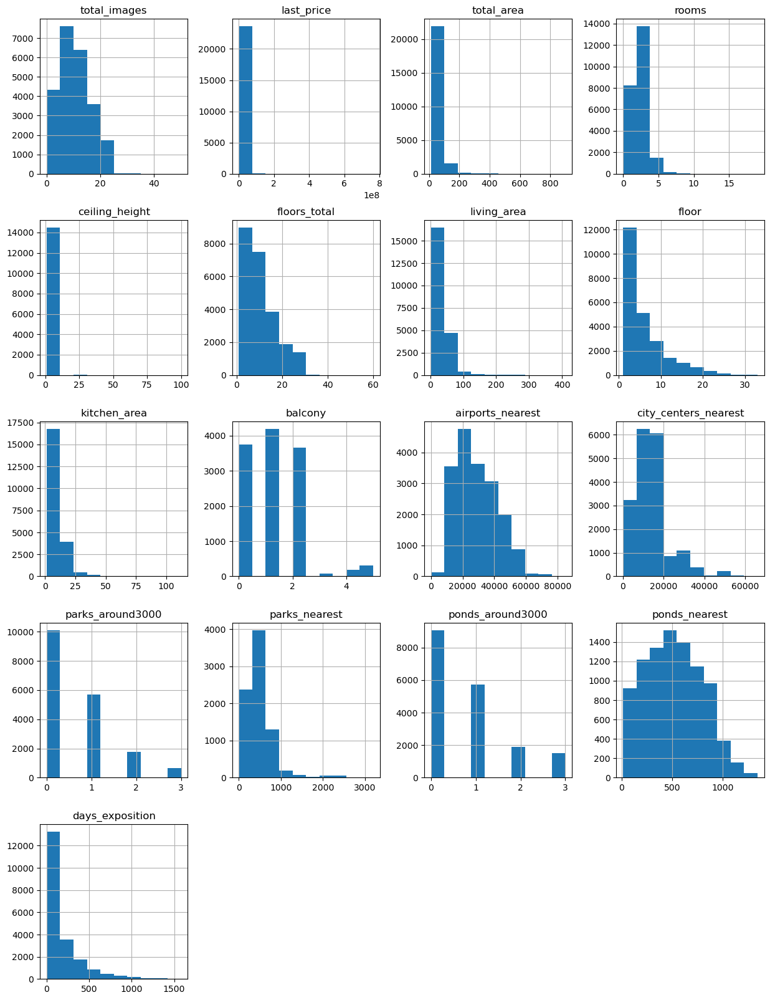

In [5]:
# Построим гистограммы для всех параметров
data.hist(figsize=(15, 20));

- все гистограммы ассиметричны и имеют положительную скошенность;
- в большинстве параметров заметны аномальные значения (выбросы) - длинный хвост с единичными значениями;
- максимальная стоимость квартиры около 800 млн руб;
- рассматриваюися данные в радиусе 60 км от центра Санкт-Петербурга;
- количество дней размещения публикации достигает 1500 дней (больше 4 лет).

**Итоги обзора данных**

В каждой строке таблицы — данные о публикуемом объявлении о продаже квартиры в Санкт-Петербурге и его окрестностях в радиусе 60 км. Часть колонок описывает саму квартиру (площадь, количество комнат, этаж, наличие балкона), другая часть рассказывает о квартографических особенностях (количество парков и водоёмов, отдаленность от центра, аэропорта, ближайшего парка и водоёма) и продажах (количество дней публикации).

Предварительно можно утверждать, что данных достаточно для выявления закономерностей рынка недвижимости, однако встречаются пропуски в данных, неправильный тип данных и аномальные значения.

Чтобы двигаться дальше, устраним выявленные недочеты в данных.

## Предобработка данных

### Обработка пропусков

In [6]:
#Рассчитаем количество пропусков по каждому столбцу
data.isna().sum()

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9195
floors_total               86
living_area              1903
floor                       0
is_apartment            20924
studio                      0
open_plan                   0
kitchen_area             2278
balcony                 11519
locality_name              49
airports_nearest         5542
city_centers_nearest     5519
parks_around3000         5518
parks_nearest           15620
ponds_around3000         5518
ponds_nearest           14589
days_exposition          3181
dtype: int64

Только в 8 стобцах из 22 нет пропусков, необходимо выявить природу пропусков и по возможности заполнить.

Рассмотрим каждый из столбцов с пропусками:

In [7]:
# Создадим вспомогательную функцию для определения количества пропусков (абсолютное и относительное занчение)
def data_gaps(data, column):
    print('Пропусков в столбце', column, data[column].isna().sum(), 'шт., что составляет', 
      round(data[column].isna().mean() * 100, 2), '%')

**`ceiling_height`**

In [8]:
# определим количество пропусков в столбце
data_gaps(data, 'ceiling_height')

Пропусков в столбце ceiling_height 9195 шт., что составляет 38.8 %


In [9]:
# рассмотрим распределение данных
data['ceiling_height'].describe()

count    14504.000000
mean         2.771499
std          1.261056
min          1.000000
25%          2.520000
50%          2.650000
75%          2.800000
max        100.000000
Name: ceiling_height, dtype: float64

Можно заметить, что есть выбивающиеся значения (аномалии), т.к. 4 квартиль имеет диапозон от 2,8 до 100 м.

**Выводы**:
- *количество пропусков*: 9195 (38,8%) - значимые пропуски
- *причины, по которым могли возникнуть пропуски*: 
  * вероятно высота потолков не является обязательным для заполнения показателем; 
  * высота потолков стандартная, поэтому пользователь решил не заполнять
- *как исправить*: т.к. связи с другими показателями нет, заполним медианным значением по данному столбцу, как наиболее стандартным (среднее не подойдет, т.к. есть аномалии)

Заполним пропуски после обработки аномальных значений для более корректных значений

**`floors_total`**

In [10]:
# определим количество пропусков в столбце
data_gaps(data, 'floors_total')

Пропусков в столбце floors_total 86 шт., что составляет 0.36 %


**Выводы**:
- *количество пропусков*: 86 (0.36%) - незначимые пропуски
- *причины, по которым могли возникнуть пропуски*: вероятно высота потолков не является обязательным для заполнения показателем 
- *как исправить*: т.к. количество этажей в доме не может быть меньше этажа квартиры, то заполним значением по данному столбцу

In [11]:
# заполним пропуски
data.loc[data['floors_total'].isna(), 'floors_total'] = data['floor']

**`living_area` и `kitchen_area`**

Рассмотрим два столбца вместе, т.к. они взаимосвязаны и относятся к площади квартиры

In [12]:
# определим количество пропусков в столбцах
data_gaps(data, 'living_area')
data_gaps(data, 'kitchen_area')

Пропусков в столбце living_area 1903 шт., что составляет 8.03 %
Пропусков в столбце kitchen_area 2278 шт., что составляет 9.61 %


In [13]:
# определим, сколько раз пропуски пересекаются
len(data[data['living_area'].isna() & data['kitchen_area'].isna()])

1464

Таким образом, большинство пропусков пересекаются, т.е. отствуют данные как о площади кухни, так и о жилой площади.

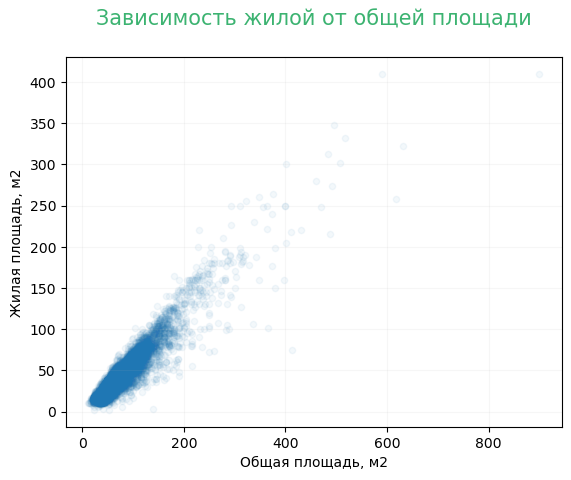

In [14]:
# рассмотрим зависимость жилой площади от общей
data.plot(x='total_area',
          y='living_area',
          kind='scatter', 
          alpha=0.05)
plt.ylabel('Жилая площадь, м2', fontsize=10)
plt.xlabel('Общая площадь, м2')
plt.title('Зависимость жилой от общей площади' + '\n',  fontsize=15, color='mediumseagreen')
plt.grid(alpha=0.1)
plt.show()

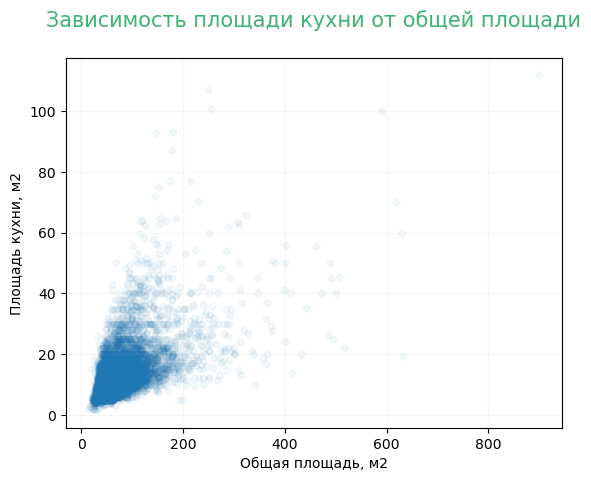

In [15]:
# рассмотрим зависимость площади кухни от общей
data.plot(x='total_area',
          y='kitchen_area', 
          kind='scatter', 
          alpha=0.05)
plt.ylabel('Площадь кухни, м2', fontsize=10)
plt.xlabel('Общая площадь, м2')
plt.title('Зависимость площади кухни от общей площади' + '\n',  fontsize=15, color='mediumseagreen')
plt.grid(alpha=0.1)
plt.show()

По двум графикам видно, что наблюдается прямая зависимость между общей площадью квартиры и ее соответствующей частью (общая площадь и жилая - наиболее коррелируемы, площадь кухни относительно общей площади имеет больший разброс значений).

**Выводы**:
- *количество пропусков*: 
  * в столбце `living_area`: 1903 шт. (8.03%) - малозначимые пропуски
  * в столбце `kitchen_area`: 2278 шт. (9.61%) - малозначимые пропуски
- *причины, по которым могли возникнуть пропуски*: 
  * вероятно площадь комнат не является обязательным для заполнения показателем 
  * пользователь заполнил только наиболее отличающуюся комнату (с большей площадью)
- *как исправить*: т.к. обе площади в сумме чаще всего меньше общей площади и с общей площадью есть прямая зависимость, то заполним медианным значением доли составляющих частей, умноженным на общую площадь. Если в сумме жилая площадь и площадь кухни после преобразований будет превышать общую площадь, то заполним разностью между общей площадью и известной составляющей.

Заполним пропуски в столбце с жилой площадью:

In [16]:
# определим медианное значение доли жилой площади
share_living_area = (data['living_area'] / data['total_area']).median()
share_living_area

0.5678598992678503

In [17]:
# создадим функцию для заполнения пропусков в столбце 'living_area'
def get_living_area(data):
    living_area = data['total_area'] * share_living_area
    if living_area + data['kitchen_area'] > data['total_area']:
        return round(data['total_area'] - data['kitchen_area'], 1)
    else:
        return round(living_area, 1)

In [18]:
# заполним пропуски в столбце 'living_area'
data.loc[data['living_area'].isna(), 'living_area'] = data.apply(get_living_area, axis=1)

Заполним пропуски в столбце с площадью кухни:

In [19]:
# определим медианное значение доли площади кухни
share_kitchen_area = (data['kitchen_area'] / data['total_area']).median()
share_kitchen_area

0.1724137931034483

In [20]:
# создадим функцию для заполнения пропусков в столбце 'kitchen_area'
def get_kitchen_area(data):
    kitchen_area = data['total_area'] * share_kitchen_area
    if kitchen_area + data['living_area'] > data['total_area']:
        return round(data['total_area'] - data['living_area'], 1)
    else:
        return round(kitchen_area, 1)

In [21]:
# заполним пропуски в столбце 'kitchen_area'
data.loc[data['kitchen_area'].isna(), 'kitchen_area'] = data.apply(get_kitchen_area, axis=1)

**`is_apartment`**

In [22]:
# определим количество пропусков в столбце
data_gaps(data, 'is_apartment')

Пропусков в столбце is_apartment 20924 шт., что составляет 88.29 %


**Выводы**:
- *количество пропусков*: 20924 (88.29%) - значимые пропуски
- *причины, по которым могли возникнуть пропуски*: признак, что квартира является апартаментами, указывают только владельцы апартаментов
- *как исправить*: заполнить значением 'False'

In [23]:
# заполним пропуски
data['is_apartment'] = data['is_apartment'].fillna('False')

**`balcony`**

In [24]:
# определим количество пропусков в столбце
data_gaps(data, 'balcony')

Пропусков в столбце balcony 11519 шт., что составляет 48.61 %


**Выводы**:
- *количество пропусков*: 11519 (48.61%) - значимые пропуски
- *причины, по которым могли возникнуть пропуски*: вероятно пропуски появились, т.к. в квартире нет балконов
- *как исправить*: заполнить значением ноль

In [25]:
# заполним пропуски
data.loc[data['balcony'].isna(), 'balcony'] = 0

**`locality_name`**

In [26]:
# определим количество пропусков в столбце
data_gaps(data, 'locality_name')

Пропусков в столбце locality_name 49 шт., что составляет 0.21 %


**Выводы**:
- *количество пропусков*: 49 (0.21%) - незначимые пропуски
- *причины, по которым могли возникнуть пропуски*: 
  * вероятно название населенного пункта  не является обязательным для заполнения показателем;
  * упущение арендодателя при заполнении
- *как исправить*: т.к. пропусков мало и нет явной связи с другими столбцами, удалим данные строки

In [27]:
# Удалим строки
data = data[~data['locality_name'].isna()]

**`airports_nearest`**

In [28]:
# определим количество пропусков в столбце
data_gaps(data, 'airports_nearest')

Пропусков в столбце airports_nearest 5534 шт., что составляет 23.4 %


**Выводы**:
- *количество пропусков*: 5534 (23.4%) - значимые пропуски
- *причины, по которым могли возникнуть пропуски*: т.к. данные картографические, вероятно возникла ошибка при выгрузке; 
- *как исправить*:
  * обратиться к коллегам, кто работает с картографическими данными, для рассмотрения данного вопроса и повторной выгрузке
  * расстояние до ближайшего аэропорта зависит от населенного пункта, где располагается квартира, поэтому пропуски лучше всего заполнить медианными значениями соответствующих расстояний в разрезе населенного пункта. Если данных по населенному пункту нет совсем, то оставить пропуски - они свойственны поселкам и отдаленным городам.
  
Замена пропусков возможна только после проверки колонки с наименованием населенного пункта на дубликаты.

**`city_centers_nearest`**

In [29]:
# определим количество пропусков в столбце
data_gaps(data, 'city_centers_nearest')

Пропусков в столбце city_centers_nearest 5511 шт., что составляет 23.3 %


**Выводы**:
- *количество пропусков*: 5511 (23.3%) - значимые пропуски
- *причины, по которым могли возникнуть пропуски*: т.к. данные картографические, вероятно возникла ошибка при выгрузке; 
- *как исправить*:
  * обратиться к коллегам, кто работает с картографическими данными, для рассмотрения данного вопроса и повторной выгрузке
  * расстояние до центра города зависит от населенного пункта, где располагается квартира, поэтому пропуски лучше всего заполнить медианными значениями соответствующих расстояний в разрезе населенного пункта. Если данных по населенному пункту нет совсем, то оставить пропуски - они свойственны поселкам и отдаленным городам.
  
Замена пропусков возможна только после проверки колонки с наименованием населенного пункта на дубликаты.

**`parks_around3000`** и **`ponds_around3000`**

In [30]:
# определим количество пропусков в столбцах
data_gaps(data, 'parks_around3000')
data_gaps(data, 'ponds_around3000')

Пропусков в столбце parks_around3000 5510 шт., что составляет 23.3 %
Пропусков в столбце ponds_around3000 5510 шт., что составляет 23.3 %


**Выводы**:
- *количество пропусков*: 5510 (23.3%) в двух столбцах - значимые пропуски
- *причины, по которым могли возникнуть пропуски*: вероятно количество парков и водоемов в радиусе 3 км равняется нулю
- *как исправить*: заполнить значения нулем

In [31]:
# заполним пропуски
data.loc[data['parks_around3000'].isna(), 'parks_around3000'] = 0
data.loc[data['ponds_around3000'].isna(), 'ponds_around3000'] = 0

**`parks_nearest`** и **`ponds_nearest`**

In [32]:
# определим количество пропусков в столбцах
data_gaps(data, 'parks_nearest')
data_gaps(data, 'ponds_nearest')

Пропусков в столбце parks_nearest 15586 шт., что составляет 65.9 %
Пропусков в столбце ponds_nearest 14565 шт., что составляет 61.59 %


Рассмотрим гипотезу, что пропуски соотвествуют строкам, где парков и водоемов рядом нет:

In [33]:
print('Количество строк, где нет парков в радиусе 3 км и есть пропуски:', 
      len(data.query('parks_around3000 == 0 and parks_nearest.isna()')))
print('Количество строк, где нет водоемов в радиусе 3 км и есть пропуски:', 
      len(data.query('ponds_around3000 == 0 and ponds_nearest.isna()')))

Количество строк, где нет парков в радиусе 3 км и есть пропуски: 15586
Количество строк, где нет водоемов в радиусе 3 км и есть пропуски: 14565


**Выводы**:
- *количество пропусков*:
  * в столбце `parks_nearest`: 15586 (65.9%) - значимые пропуски
  * в столбце `ponds_nearest`: 14565 (61.59%) - значимые пропуски
- *причины, ко которым могли возникнуть пропуски*: количество парков и водоемов в радиусе 3 км равняется нулю
- *как исправить*: установить значение по умолчанию, например, -1, чтобы понимать, что парков и водоемов поблизости нет.

In [34]:
# заполним пропуски
data.loc[data['parks_nearest'].isna(), 'parks_nearest'] = -1
data.loc[data['ponds_nearest'].isna(), 'ponds_nearest'] = -1

**`days_exposition`**

In [35]:
# определим количество пропусков в столбце
data_gaps(data, 'days_exposition')

Пропусков в столбце days_exposition 3180 шт., что составляет 13.45 %


In [36]:
data['days_exposition'].describe()

count    20470.000000
mean       180.753200
std        219.777916
min          1.000000
25%         45.000000
50%         95.000000
75%        231.000000
max       1580.000000
Name: days_exposition, dtype: float64

**Выводы**:
- *количество пропусков*: 3180 (13.45%) - малозначительные пропуски
- *причины, по которым могли возникнуть пропуски*:
  * объявление на момент выгрузки не снято с публикации
  * техническая ошибка при выгрузке
- *как исправить*: т.к. неизвестна прямая зависимость от других признаков и есть вероятность, что объявление не снято с публикации на момент выгрузки, то пропуски лучше всего оставить незаполненными

In [37]:
# Проверим остались ли пропуски после преобразований
data.isna().sum()

total_images               0
last_price                 0
total_area                 0
first_day_exposition       0
rooms                      0
ceiling_height          9160
floors_total               0
living_area                0
floor                      0
is_apartment               0
studio                     0
open_plan                  0
kitchen_area               0
balcony                    0
locality_name              0
airports_nearest        5534
city_centers_nearest    5511
parks_around3000           0
parks_nearest              0
ponds_around3000           0
ponds_nearest              0
days_exposition         3180
dtype: int64

**Итоги обработки пропусков:**

Заполнены все выявленные пропуски, за исключением следующих:
   - название населенного пункта невозможно восстановить, поэтому 49 строк удалены из выборки;
   - расстояние до ближайшего парка/водоема в радиусе 3 км невозможно заполнить, т.к. парков/водоемов в указанном радиусе нет, поэтому поставлено значение по умолчанию "-1";
   - количество дней публикации нельзя заполнить, т.к. вероятно объявления еще не сняты с публикации;
   - расстояния до ближайшего аэропорта и центра города будут заполнены после проверки наименований населенных пунктов на дубликаты;
   - высота потолков будет заполнена после обработки аномальных значений.

### Изменение типов данных

На этапе рассмотрения общей информации о данных было выявлено два столбца с неправильным типом данных: `first_day_exposition` и `is_apartment`. Рассмотрим данные еще раз более внимательно.

In [38]:
# Выведем первые 5 строк
data.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,city_centers_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.0,2019-03-07T00:00:00,3,2.70,16.0,51.0,8,False,False,False,25.0,0.0,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000.0,40.4,2018-12-04T00:00:00,1,NaN,11.0,18.6,1,False,False,False,11.0,2.0,посёлок Шушары,12817.0,18603.0,0.0,-1.0,0.0,-1.0,81.0
2,10,5196000.0,56.0,2015-08-20T00:00:00,2,NaN,5.0,34.3,4,False,False,False,8.3,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000.0,159.0,2015-07-24T00:00:00,3,NaN,14.0,90.3,9,False,False,False,27.4,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000.0,100.0,2018-06-19T00:00:00,2,3.03,14.0,32.0,13,False,False,False,41.0,0.0,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0


In [39]:
# Рассмотрим исходные типы данных
data.dtypes

total_images              int64
last_price              float64
total_area              float64
first_day_exposition     object
rooms                     int64
ceiling_height          float64
floors_total            float64
living_area             float64
floor                     int64
is_apartment             object
studio                     bool
open_plan                  bool
kitchen_area            float64
balcony                 float64
locality_name            object
airports_nearest        float64
city_centers_nearest    float64
parks_around3000        float64
parks_nearest           float64
ponds_around3000        float64
ponds_nearest           float64
days_exposition         float64
dtype: object

Помимо раннее указанных столбцов можно скорректировать тип колонок `floors_total`, `balcony`, `parks_around3000`, `ponds_around3000`, т.к. количество этажей, балконов, парков и водоемов всегда целое число.
Также последняя цена за квартиры всегда целое число, поэтому можно скорректировать тип.

In [40]:
# Преобразуем тип колонок из вещественного в целые числа
data['floors_total'] = data['floors_total'].astype(int)
data['last_price'] = data['last_price'].astype(int)
data['balcony'] = data['balcony'].astype(int)
data['parks_around3000'] = data['parks_around3000'].astype(int)
data['ponds_around3000'] = data['ponds_around3000'].astype(int)

In [41]:
# Приведем тип колонки `is_apartment` к типу булева
data['is_apartment'] = data['is_apartment'].astype(bool)

In [42]:
# Приведем тип колонки `first_day_exposition` к типу datetime
data['first_day_exposition'] = pd.to_datetime(data['first_day_exposition'], format='%Y-%m-%dT%H:%M:%S')

In [43]:
# Проверим полученные типы данных
data.dtypes

total_images                     int64
last_price                       int32
total_area                     float64
first_day_exposition    datetime64[ns]
rooms                            int64
ceiling_height                 float64
floors_total                     int32
living_area                    float64
floor                            int64
is_apartment                      bool
studio                            bool
open_plan                         bool
kitchen_area                   float64
balcony                          int32
locality_name                   object
airports_nearest               float64
city_centers_nearest           float64
parks_around3000                 int32
parks_nearest                  float64
ponds_around3000                 int32
ponds_nearest                  float64
days_exposition                float64
dtype: object

In [44]:
# Проверим данные
data.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,city_centers_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.0,8,True,False,False,25.0,0,Санкт-Петербург,18863.0,16028.0,1,482.0,2,755.0,NaN
1,7,3350000,40.4,2018-12-04,1,NaN,11,18.6,1,True,False,False,11.0,2,посёлок Шушары,12817.0,18603.0,0,-1.0,0,-1.0,81.0
2,10,5196000,56.0,2015-08-20,2,NaN,5,34.3,4,True,False,False,8.3,0,Санкт-Петербург,21741.0,13933.0,1,90.0,2,574.0,558.0
3,0,64900000,159.0,2015-07-24,3,NaN,14,90.3,9,True,False,False,27.4,0,Санкт-Петербург,28098.0,6800.0,2,84.0,3,234.0,424.0
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.0,13,True,False,False,41.0,0,Санкт-Петербург,31856.0,8098.0,2,112.0,1,48.0,121.0


**Итоги анализа типов данных:**

Все необходимые типы столбцов скорректированы:
   - типы столбцов `floors_total`, `balcony`, `parks_around3000`, `ponds_around3000` приведены к целым числам;
   - тип столбца `first_day_exposition` приведен к дате и времени;
   - тип столбца `is_apartment` приведен к типу булева.

При необходимости в целях экономии памяти возможно изменение следующих типов данных:
   - float64 на float32, т.к. для исследования достаточно 4 байт памяти;
   - int62 на int32, т.к. в исследовании не используются очень большие или очень маленькие числа.

### Обработка дубликатов

Следующим пунктом рассмотрим данные на дубликаты: явные и неявные. Неполные дубликаты в данном датафрейме выявить сложно из-за большого количесства аналитик.

Проверим на явные дубликаты:

In [45]:
print('Количество явных дубликатов строк таблицы:', data.duplicated().sum())

Количество явных дубликатов строк таблицы: 0


Явных дубликатов не выялвено. Однако после корректировки типов данных строковые значения остались в столбце `locality_name`. Рассмотрим значения на предмет неявдных дубликатов:

In [46]:
print('Количество уникальных значений в столбце:', data['locality_name'].nunique())
data['locality_name'].unique()

Количество уникальных значений в столбце: 364


array(['Санкт-Петербург', 'посёлок Шушары', 'городской посёлок Янино-1',
       'посёлок Парголово', 'посёлок Мурино', 'Ломоносов', 'Сертолово',
       'Петергоф', 'Пушкин', 'деревня Кудрово', 'Коммунар', 'Колпино',
       'поселок городского типа Красный Бор', 'Гатчина', 'поселок Мурино',
       'деревня Фёдоровское', 'Выборг', 'Кронштадт', 'Кировск',
       'деревня Новое Девяткино', 'посёлок Металлострой',
       'посёлок городского типа Лебяжье',
       'посёлок городского типа Сиверский', 'поселок Молодцово',
       'поселок городского типа Кузьмоловский',
       'садовое товарищество Новая Ропша', 'Павловск',
       'деревня Пикколово', 'Всеволожск', 'Волхов', 'Кингисепп',
       'Приозерск', 'Сестрорецк', 'деревня Куттузи', 'посёлок Аннино',
       'поселок городского типа Ефимовский', 'посёлок Плодовое',
       'деревня Заклинье', 'поселок Торковичи', 'поселок Первомайское',
       'Красное Село', 'посёлок Понтонный', 'Сясьстрой', 'деревня Старая',
       'деревня Лесколово', '

При анализе названий населенных пунктов выявлено обозначение одних и тех же населенных пунктов, как:
- "поселок" и "посёлок";
- "поселок" и "поселок городского типа";
- "поселок" и "посёлок городского типа";
- "поселок" и "городской посёлок";
- "поселок" и "городской поселок";
- "поселок" и "коттеджный посёлок";
- "поселок" и "коттеджный поселок";
- "поселок" и "посёлок станции";
- "поселок" и "поселок станции";
- "поселок" и "посёлок при железнодорожной станции";
- "поселок" и "поселок при железнодорожной станции";
- "поселок" и "садовое товарищество".

Приведем данные названия к единообразию - заменим на "поселок":

In [47]:
# Создадим функцию для замены названия населенного пункта
def get_locality_name(row):
    replace_name = ['посёлок городского типа', 'поселок городского типа', 'посёлок станции', 'поселок станции', 
                    'посёлок при железнодорожной станции', 'поселок при железнодорожной станции',
                    'городской посёлок', 'городской поселок', 'коттеджный посёлок', 'коттеджный поселок',
                    'посёлок', 'садовое товарищество']
    try:
        for i in replace_name:
            if i in row:
                return row.replace(i, 'поселок')
        return row
    except:
        return row

In [48]:
# Заменим названия населенных пунктов
data['locality_name'] = data['locality_name'].apply(get_locality_name)

In [49]:
# Проверим именения
print('Количество уникальных значений в столбце:', data['locality_name'].nunique())
data['locality_name'].unique()

Количество уникальных значений в столбце: 316


array(['Санкт-Петербург', 'поселок Шушары', 'поселок Янино-1',
       'поселок Парголово', 'поселок Мурино', 'Ломоносов', 'Сертолово',
       'Петергоф', 'Пушкин', 'деревня Кудрово', 'Коммунар', 'Колпино',
       'поселок Красный Бор', 'Гатчина', 'деревня Фёдоровское', 'Выборг',
       'Кронштадт', 'Кировск', 'деревня Новое Девяткино',
       'поселок Металлострой', 'поселок Лебяжье', 'поселок Сиверский',
       'поселок Молодцово', 'поселок Кузьмоловский',
       'поселок Новая Ропша', 'Павловск', 'деревня Пикколово',
       'Всеволожск', 'Волхов', 'Кингисепп', 'Приозерск', 'Сестрорецк',
       'деревня Куттузи', 'поселок Аннино', 'поселок Ефимовский',
       'поселок Плодовое', 'деревня Заклинье', 'поселок Торковичи',
       'поселок Первомайское', 'Красное Село', 'поселок Понтонный',
       'Сясьстрой', 'деревня Старая', 'деревня Лесколово',
       'поселок Новый Свет', 'Сланцы', 'село Путилово', 'Ивангород',
       'Мурино', 'Шлиссельбург', 'Никольское', 'Зеленогорск',
       'Сосн

**Итоги обработки дублирующих значений:**
- явных дубликатов строк не выявлено;
- выявлены и заменены все неявные дубликаты наименований населенных пунктов (48 дублирующих значений).

### Обработка аномальных значений

При рассмотрении гистограмм были выялвены аномальные значения. Исследуем все числовые колонки на предмет выбросов (аномальных значений) более подробно:

In [50]:
# Получим описательную статистику по всем числовым колонкам
data.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,city_centers_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,23650.000000,2.365000e+04,23650.000000,23650.000000,14490.000000,23650.000000,23650.000000,23650.000000,23650.000000,23650.000000,18116.000000,18139.000000,23650.000000,23650.000000,23650.000000,23650.000000,20470.000000
mean,9.862326,6.541127e+06,60.329069,2.070106,2.771287,10.673784,34.565046,5.893277,10.481136,0.591712,28803.225878,14197.860742,0.469091,166.700761,0.590359,198.393615,180.753200
std,5.682278,1.089640e+07,35.661808,1.078620,1.261593,6.593455,22.345618,4.883317,6.024556,0.959662,12637.314144,8606.830295,0.748458,307.191767,0.883539,305.605088,219.777916
min,0.000000,1.219000e+04,12.000000,0.000000,1.000000,1.000000,2.000000,1.000000,0.000000,0.000000,0.000000,181.000000,0.000000,-1.000000,0.000000,-1.000000,1.000000
25%,6.000000,3.400000e+06,40.000000,1.000000,2.520000,5.000000,19.000000,2.000000,7.000000,0.000000,18575.750000,9241.000000,0.000000,-1.000000,0.000000,-1.000000,45.000000
50%,9.000000,4.650000e+06,52.000000,2.000000,2.650000,9.000000,30.000000,4.000000,9.000000,0.000000,26756.500000,13105.000000,0.000000,-1.000000,0.000000,-1.000000,95.000000
75%,14.000000,6.799000e+06,69.700000,3.000000,2.800000,16.000000,42.100000,8.000000,12.000000,1.000000,37294.000000,16293.000000,1.000000,301.000000,1.000000,389.000000,231.000000
max,50.000000,7.630000e+08,900.000000,19.000000,100.000000,60.000000,409.700000,33.000000,112.000000,5.000000,84869.000000,65968.000000,3.000000,3190.000000,3.000000,1344.000000,1580.000000


- `total_images` - есть выбросы, но не являются аномалиями, т.к. количество фото в объявлении вариативно и не имеет какой-то нормы, может быть и 50;
- `last_price` - есть выбросы, т.к. выборка включает в себя различные населенные пункты (города, поселки, села, деревни), для которых цена различается;
- `total_area` - есть выбросы, т.к. площадь квартиры/дома в основном входит в диапозон от 12 м2 до 69,7 м2 (3 квартиля), а более дорогие квартиры до 900 м2 (выбросы будут удалены согласно анализу цен).
- `rooms` - есть выбросы, необходимо рассмотреть подробнее;
- `ceiling_height` - есть выбросы, необходимо рассмотреть подробнее;
- `floors_total` - есть выбросы, но не являются аномалиями, т.к. выборка включает в себя различные населенные пункты (города, поселки, села, деревни), где квартира/дом могут быть как одноэтажными, так и небоскребами;
- `living_area` - есть выбросы (аналогично общей площади квартиры);
- `floor` - есть выбросы, но не являются аномалиями (аналогично количеству квартир в доме);
- `kitchen_area` - есть выбросы (аналогично общей площади квартиры);
- `balcony` - есть выбросы, но не являются аномалиями, т.к. в основном преобладают квартиры с 0 или 1 балконом, но исключения для квартир с большой площадью возможны;
- `airports_nearest` - есть выбросы, но не являются аномалиями, т.к. в Санкт-Петербурге один аэропорт и расстояние от дальних населенных пунктов может достигать 85 км (например, поселок Молодежное);
- `city_сenters_nearest` - есть выбросы, но не являются аномалиями (аналогично расстоянию до ближайшего аэропорта);
- `parks_around3000` - есть выбросы, но не являются аномалиями, т.к. количество парков в радиусе 3 км в хорошем районе может достигать трех;
- `ponds_around3000` - есть выбросы, но не являются аномалиями (аналогично количеству парков в радиусе 3 км);
- `parks_nearest` - есть выбросы, но не являются аномалиями, т.к. "-1" - значение по умолчанию, установленное раннее, а расстояние до ближайшего парка может быть больше 3 км;
- `ponds_nearest` - есть выбросы, но не являются аномалиями (аналогично расстоянию до ближайшего парка);
- `days_exposition` - есть выбросы, но не являются аномалиями, т.к. данные о количестве дней публикации формируются автоматически и могут иметь большой разброс в зависимости от стоимости и местоположения объекта недвижимости.

Таким образом, подробнее необходимо рассмотреть значения столбцов `last_price`, `rooms` и `ceiling_height`.

**`last_price`**

In [51]:
# Создадим пространство (фигуру)
fig = go.Figure()

# Построим диаграмму размаха
fig.add_trace(
    go.Box(x=data['last_price'], 
           name='',
           marker_color = '#3D9970'
          )
)

fig.update_layout(title_text='Диаграмма размаха последней цены квартиры',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',)
fig.show()

Посчитаем количество выбросов:

In [52]:
len(data.query('last_price > 11894400'))

2055

Согласно диаграмме размаха максимально допустимое значение 11,9 млн руб, однако есть более 2000 выбросов и даже довольно далеких (больше 100 млн). Однако для цены выбросы допустимы, так как рассматриваются разные населенные пункты. Также Санкт-Петербург - большой город и цены на квартиры в нем могут существенно различаться в зависимости от района.

Рассмотрим распределение значений последней цены для более точной идентификации аномальных значений:

In [53]:
# Создадим пространство (фигуру)
fig = go.Figure()

# Построим гистограмму
fig.add_trace(
    go.Histogram(x=data['last_price'], 
                 name='', 
                 marker_color = '#3D9970',
                 nbinsx=200
                )
)

fig.update_layout(title_text='Последняя цена квартиры',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.01)
fig.show()

In [54]:
print('Количество объектов с ценой более 40 млн:', len(data.query('last_price > 40000000')), 
      ', что составляет', round(len(data.query('last_price > 30000000'))/len(data) * 100, 2), '%')

Количество объектов с ценой более 40 млн: 182 , что составляет 1.34 %


Объекты с ценой более 10 млн — уже редкие, а на участке больше 40 млн гистограмма сливается с нулём (таких объектов единицы). Поэтому разумно удалить значения больше 40 млн (182 строк), т.к. данные могут исказить результаты исследования.

In [55]:
# Удаление строк
data = data.query('last_price <= 40000000')

In [56]:
# Проверим получившиеся данные
fig = go.Figure()

fig.add_trace(
    go.Box(x=data['last_price'], 
           name='',
           marker_color = '#3D9970'
          )
)

fig.update_layout(title_text='Диаграмма размаха последней цены квартиры (после исключения аномальных значений)',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',)
fig.show()

**`rooms`**

In [57]:
# Построим диаграмму размаха
fig = go.Figure()

fig.add_trace(
    go.Box(x=data['rooms'], 
           name='',
           marker_color = 'orange'
          )
)

fig.update_layout(title_text='Диаграмма размаха количества комнат в квартире',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',)
fig.show()

Рассмотрим распределение значений количества комнат:

In [58]:
# Создадим пространство (фигуру)
fig = go.Figure()

# Построим гистограмму
fig.add_trace(
    go.Histogram(x=data['rooms'], 
                 name='', 
                 marker_color = 'orange', 
                 texttemplate="%{y}",
                 opacity=0.8
                )
)

fig.update_layout(title_text='Количество комнат в квартире',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.1)
fig.show()

Выделяются значения 0 и больше 7, т.к. 0 комнат - вызывает сомнения, а больше 7 - слишком большое количество и малое количество квартир.

Предположим, что 0 комнат - это квартира со свободной планировкой или студия:

In [59]:
print('Количество публикаций с нулевым значением комнат:', len(data.query('rooms == 0')))
print('Количество публикаций с нулевым значением комнат, где свободная планировка или студия:', 
      len(data.query('(open_plan == True or studio == True) and rooms == 0')))

Количество публикаций с нулевым значением комнат: 196
Количество публикаций с нулевым значением комнат, где свободная планировка или студия: 196


Таким образом, гипотеза о том, что ноль комнат - это квартира со свободной планировкой или студия - полностью подтверждена. Данные не являются аномалиями.

Рассмотрим данные с большим количеством комнат:

In [60]:
# Создадим сводную таблицу
data_rooms = data.pivot_table(index='rooms', 
                              values=['total_area', 'last_price'], 
                              aggfunc='median'
                             )

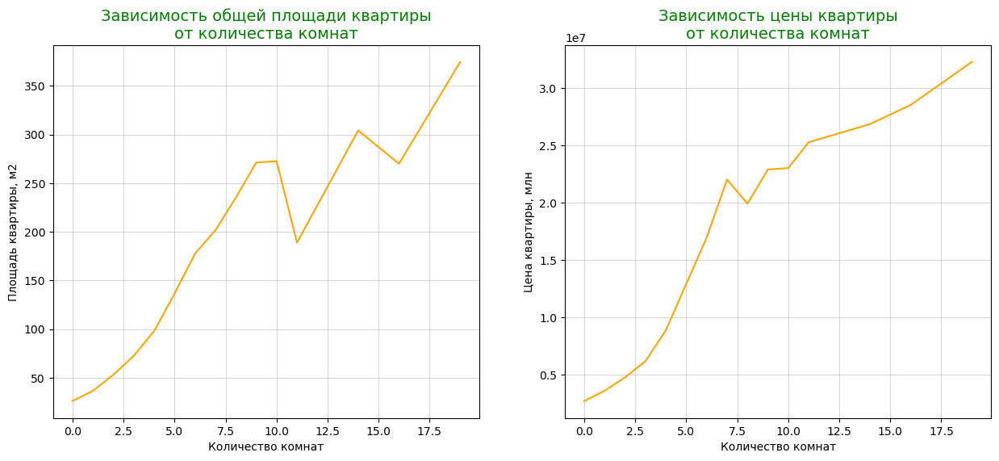

In [61]:
# Построим графики зависимостей
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

ax[0].plot(data_rooms.index, data_rooms['total_area'], color='orange')
ax[1].plot(data_rooms.index, data_rooms['last_price'], color='orange')

ax[0].set_xlabel('Количество комнат')
ax[0].set_ylabel('Площадь квартиры, м2')
ax[0].set_title('Зависимость общей площади квартиры' + '\n' + 'от количества комнат', fontsize = 14, color = 'Green')
ax[0].grid(alpha=0.5)
ax[1].set_xlabel('Количество комнат')
ax[1].set_ylabel('Цена квартиры, млн')
ax[1].set_title('Зависимость цены квартиры' + '\n' + 'от количества комнат', fontsize = 14, color = 'Green')
ax[1].grid(alpha=0.5)

Таким образом, мы видим, что графики сонаправлены, но:
- в первом случае видна зависимость между количеством комнат и общей площадью квартиры, но при большом количестве комнат зависимость слабеет, т.к. есть спад на 11 и 16 комнатах;
- во втором случае демонстрируется прямая зависимость между ценой и количеством комнат (с увеличением количества комнат растет и цена).

Для более точного выявления параметров, определяющих цену недвижимости, исключим единичные случаи с большим количеством комнат (больше 7).

In [62]:
# Удаление строк
data = data.query('rooms <= 7')

In [63]:
# Проверим полученные данные
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['rooms'], 
                 name='', 
                 marker_color = 'orange', 
                 texttemplate="%{y}",
                 opacity=0.8
                )
)

fig.update_layout(title_text='Количество комнат в квартире',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.2)
fig.show()

**`ceiling_height`**

In [64]:
# Построим диаграмму размаха для высоты потолков
fig = go.Figure()

fig.add_trace(
    go.Box(x=data['ceiling_height'], 
           name='',
           marker_color = 'SteelBlue'
          )
)

fig.update_layout(title_text='Диаграмма размаха высоты потолков в квартире',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',)
fig.show()

In [65]:
# Посмотрим описатульную статистику
data['ceiling_height'].describe()

count    14356.000000
mean         2.765302
std          1.264746
min          1.000000
25%          2.510000
50%          2.650000
75%          2.800000
max        100.000000
Name: ceiling_height, dtype: float64

Таким образом, согласна диаграмме размаха выбросами являются значения, которые не входят в диапазон 2,2-3,23 м - средний показатель. Однако можно заметить большое количество строк со значениями от 3,23 до 4 м, что реально для квартир Санкт-Петербурга, т.к. в СНиП не закреплено максимальное значение высоты потолка.

Также стоит отметить, что согласно СНиП высота потолков не может быть ниже 2,5 м, поэтому данные строки лучше исключить.

In [66]:
# Рассмотрим подробнее значения от 4 м
data.query('ceiling_height > 4')['ceiling_height'].value_counts()

4.20      9
27.00     8
25.00     7
4.50      7
8.00      3
4.10      3
4.19      2
32.00     2
4.14      1
4.25      1
20.00     1
4.70      1
4.15      1
22.60     1
5.30      1
5.80      1
27.50     1
10.30     1
14.00     1
8.30      1
4.40      1
4.30      1
5.50      1
26.00     1
24.00     1
4.37      1
4.80      1
4.06      1
5.00      1
100.00    1
Name: ceiling_height, dtype: int64

Предположим, что в данных есть ошибка и значения больше 20м - это 2.0 м. Скорректируем данные

In [67]:
data.update(data[data['ceiling_height'] >= 20]['ceiling_height']/10)

In [68]:
# Проверим распредление значений после изменений
data.query('ceiling_height > 4')['ceiling_height'].value_counts()

4.20     9
4.50     7
8.00     3
4.10     3
4.19     2
4.15     1
5.30     1
10.30    1
5.80     1
4.70     1
4.25     1
4.14     1
14.00    1
5.50     1
4.40     1
4.30     1
5.00     1
8.30     1
4.37     1
4.80     1
4.06     1
10.00    1
Name: ceiling_height, dtype: int64

In [69]:
# Рассмотрим данные строки
data.query('ceiling_height > 4')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,city_centers_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
154,1,8200000,80.0,2018-11-06,3,4.15,3,44.2,2,True,False,False,12.2,0,Санкт-Петербург,20562.0,3167.0,2,344.0,1,838.0,38.0
1053,13,550000,29.0,2018-02-01,1,5.00,3,16.5,1,False,False,False,5.0,0,Бокситогорск,NaN,NaN,0,-1.0,0,-1.0,6.0
1129,20,6695000,36.9,2018-09-28,1,4.06,5,22.0,2,True,False,False,7.2,0,Санкт-Петербург,21725.0,2990.0,1,596.0,1,866.0,110.0
2639,17,4850000,59.7,2017-11-18,3,4.19,5,46.3,4,True,False,False,6.4,1,Санкт-Петербург,42964.0,15468.0,0,-1.0,0,-1.0,60.0
2802,7,14950000,50.0,2016-03-06,2,4.80,3,30.0,2,True,False,False,10.0,0,Санкт-Петербург,24433.0,1725.0,1,589.0,3,161.0,160.0
2823,8,2700000,39.0,2018-02-01,1,4.50,6,18.3,6,True,False,False,8.4,0,поселок Токсово,NaN,NaN,0,-1.0,0,-1.0,NaN
2843,15,11990000,104.0,2018-03-13,3,4.20,3,66.0,2,True,False,False,15.0,0,Санкт-Петербург,22393.0,3884.0,0,-1.0,0,-1.0,350.0
2999,11,4450000,36.0,2017-12-12,1,4.19,5,18.0,1,True,False,False,8.0,0,Санкт-Петербург,24689.0,4256.0,1,1077.0,3,690.0,78.0
3067,13,6600000,95.0,2018-09-08,2,4.50,7,45.0,7,True,False,False,25.0,2,Выборг,NaN,NaN,0,-1.0,0,-1.0,96.0
3474,3,1400000,30.0,2018-03-16,1,8.00,5,15.3,2,False,False,False,7.3,0,деревня Нурма,NaN,NaN,0,-1.0,0,-1.0,125.0


Квартиры имеют маленькую площадь и относительно небольшую цену, некоторые даже находятся не в Санкт-Петербурге. Предположим, что это искаженные данные и исключим их из дальнейшего анализа.

Таким образом, необходимо удалить строки, где высота потолков меньше 2,5 м и больше 4 м. Т.к. в данном столбце есть пропуски, то строки будут удалены после обработки пропусков. 

**Итоги обработки аномальных значений:**
- рассмотрены все числовые столбцы на предмет выбросов;
- скорректированы данные о высоте потолков согласно гипотезе, что в данных есть ошибка и значение 20 м - это 2.0 м и т.д.;
- нормальными значениями высоты потолков приняты значения в диапозоне от 2.5 м до 4 м, строки с аномально низкими и высокими значениями будут удалены после заполнения пропусков;
- нормальными значениями стоимости объектов недвижимости приняты значения до 40 млн руб., строки с аномально высокими значениями удалены, т.к. данные могут исказить результаты;
- полностью подтвердилась гипотеза о том, что ноль комнат - это квартира со свободной планировкой или студия, данные не являются аномалиями;
- нормальными значениями количества комнат приняты значения до 7, строки с аномально большим количеством комнат удалены, т.к. данные могут исказить результаты.

### Обработка пропусков (продолжение)

После корректировки наименований населенных пунктов заполним пропуски в столбцах `airports_nearest` и `cityCenters_nearest`

In [70]:
# заполним пропуски в столбце 'airports_nearest'
for name in data['locality_name'].unique():
    data.loc[(data['locality_name'] == name) & (data['airports_nearest'].isna()), 'airports_nearest'] =\
    (data.loc[data['locality_name'] == name, 'airports_nearest']).median()

In [71]:
# заполним пропуски в столбце 'city_centers_nearest'
for name in data['locality_name'].unique():
    data.loc[(data['locality_name'] == name) & (data['city_centers_nearest'].isna()), 'city_centers_nearest'] =\
    (data.loc[data['locality_name'] == name, 'city_centers_nearest']).median()

In [72]:
print('Пропусков в столбце "airports_nearest":', data['airports_nearest'].isna().sum())
print('Пропусков в столбце "city_centers_nearest":', data['city_centers_nearest'].isna().sum())

Пропусков в столбце "airports_nearest": 4864
Пропусков в столбце "city_centers_nearest": 4864


Расстояния до ближайшего аэропорта и центра города частисно остались не заполнены, т.к. данных по поселкам и отдаленным городам нет совсем.

После обработки аномальных значений заполним пропуски по данным высоты потолка:

In [73]:
# заполним пропуски
data.loc[data['ceiling_height'].isna(), 'ceiling_height'] = data['ceiling_height'].median()

In [74]:
# Проверим остались ли пропуски после преобразований
data['ceiling_height'].isna().sum()

0

Пропуски заполнены, теперь можно удалить уномальные значения (меньше 2,2 м и больше 4,5 м):

In [75]:
# Удаление строк
data = data.query('ceiling_height >= 2.5 and ceiling_height <= 4')

In [76]:
# Проверим полученное распределение значений после удаления уномалий и пропусков
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['ceiling_height'], 
                 name='',
                 nbinsx=30,
                 texttemplate="%{y}",
                 opacity=0.8
                )
)

fig.update_layout(title_text='Высота потолков, м',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.01)
fig.show()

### Добавление новых столбцов

Для дальнейшего анализа необходимо рассчитать и добавить несколько колонок:
- цена одного квадратного метра
- день недели публикации объявления (0 — понедельник, 1 — вторник и так далее)
- месяц публикации объявления
- год публикации объявления
- тип этажа квартиры (значения — «первый», «последний», «другой»)
- расстояние до центра города в километрах

In [77]:
# Добавим новый столбец 'price_meter' (цена одного квадратного метра)
data['price_per_area'] = round(data['last_price'] / data['total_area'], 2)

# Добавим новый столбец 'weekday_exposition' (день недели публикации объявления (0 — понедельник, 1 — вторник и так далее))
data['weekday_exposition'] = data['first_day_exposition'].dt.weekday

# Добавим новый столбец 'month_exposition' (месяц публикации объявления)
data['month_exposition'] = data['first_day_exposition'].dt.month

# Добавим новый столбец 'year_exposition' (год публикации объявления)
data['year_exposition'] = data['first_day_exposition'].dt.year

# Для категоризации этажей создадим функцию 'type_floor'
def get_type_floor(data):
    if data['floor'] == 1:
        return 'первый'
    elif data['floor'] == data['floors_total']:
        return 'последний'
    else:
        return 'другой'

# Добавим новый столбец 'type_floor' (тип этажа квартиры (значения — «первый», «последний», «другой»))    
data['type_floor'] = data.apply(get_type_floor, axis=1)

# Добавим новый столбец 'city_сenters_nearest_km' (расстояние до центра города в километрах)
data['city_centers_nearest_km'] = round(data['city_centers_nearest'] / 1000)

In [78]:
# Проверим новые столбцы
data.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,city_centers_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,price_per_area,weekday_exposition,month_exposition,year_exposition,type_floor,city_centers_nearest_km
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.0,8,True,False,False,25.0,0,Санкт-Петербург,18863.0,16028.0,1,482.0,2,755.0,NaN,120370.37,3,3,2019,другой,16.0
1,7,3350000,40.4,2018-12-04,1,2.65,11,18.6,1,True,False,False,11.0,2,поселок Шушары,12817.0,18603.0,0,-1.0,0,-1.0,81.0,82920.79,1,12,2018,первый,19.0
2,10,5196000,56.0,2015-08-20,2,2.65,5,34.3,4,True,False,False,8.3,0,Санкт-Петербург,21741.0,13933.0,1,90.0,2,574.0,558.0,92785.71,3,8,2015,другой,14.0
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.0,13,True,False,False,41.0,0,Санкт-Петербург,31856.0,8098.0,2,112.0,1,48.0,121.0,100000.00,1,6,2018,другой,8.0
5,10,2890000,30.4,2018-09-10,1,2.65,12,14.4,5,True,False,False,9.1,0,поселок Янино-1,NaN,NaN,0,-1.0,0,-1.0,55.0,95065.79,0,9,2018,другой,NaN


## Исследовательский анализ данных

### Изучение параметров объекта

Рассмотрим параметры квартиры поотдельности:

**`total_area`**

In [79]:
# Рассмотрим распределение значений общей площади
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['total_area'], 
                 marker_color='lightsalmon',
                 xbins=dict(size=4)
                )
)

fig.update_layout(title_text='Общая площадь квартиры, м2',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.01)
fig.show()

In [80]:
# Создадим сводную таблицу по данным о количестве комнат и их площади
data.pivot_table(index='rooms',
                 values='total_area', 
                 aggfunc=['median', 'count']
                )

,median,count
,total_area,total_area
rooms,,
0,26.0,195
1,36.6,8001
2,53.0,7871
3,72.5,5714
4,98.0,1126
5,136.5,289
6,177.5,88
7,201.5,43


**Вывод:**
- распределение значений общей площади квартиры асимметрично и имеет положительную скошенность (до 48 - восходящее движение, после постепенное снижение с длинным хвостом до 470);
    - Больше всего квартир находится в диапозоне 32-48 м2, что объясняется большим количеством объявлений о продаже 1-комнатных и 2-комнатных квартир;
    - В диапозоне 48-76 м2 в основном располагаются объявления о продаже 2-комнатных и 3-комнатных квартир;
    - В диапозоне 76-100 м2 в основном располагаются объявления о продаже 3-комнатных и 4-комнатных квартир;
    - Далее - 4-комнатных и более квартир.

**`living_area`**

In [81]:
# Рассмотрим распределение значений жилой площади
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['living_area'], 
                 marker_color='lightsalmon',
                 xbins=dict(size=3)
                )
)

fig.update_layout(title_text='Жилая площадь квартиры, м2',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.01)
fig.show()

In [82]:
# Создадим сводную таблицу по данным о количестве комнат и их площади
data.pivot_table(index='rooms',
                 values='living_area', 
                 aggfunc=['median', 'count']
                )

,median,count
,living_area,living_area
rooms,,
0,18.00,195
1,17.80,8001
2,30.50,7871
3,44.65,5714
4,62.95,1126
5,89.20,289
6,115.00,88
7,132.00,43


**Вывод:**
- распределение значений жилой площади квартиры асимметрично и имеет положительную скошенность (до 18 - восходящее движение, после постепенное снижение с длинным хвостом до 280);
- На графике можно заметить 3 пика:
    - Больше всего квартир находится в диапозоне 15-21 м2, что свойственно 1-комнатным квартирам (около 8000 объявлений);
    - Второй пик - 27-33 м2, что свойственно 2-комнатным квартирам (меньше 7900 объявлений);
    - Третий пик - 39-45 м2, что свойственно 3-комнатным квартирам (около 5700 объявлений).

**`kitchen_area`**

In [83]:
# Рассмотрим распределение значений площади кухни
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['kitchen_area'], 
                 marker_color='lightsalmon',
                 xbins=dict(size=1)
                )
)

fig.update_layout(title_text='Площадь кухни, м2',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.01)
fig.show()

In [84]:
# Создадим сводную таблицу по данным о количестве комнат и их площади
data.pivot_table(index='rooms',
                 values='kitchen_area', 
                 aggfunc=['median', 'count']
                )

,median,count
,kitchen_area,kitchen_area
rooms,,
0,4.50,195
1,9.00,8001
2,8.90,7871
3,10.00,5714
4,11.38,1126
5,15.10,289
6,18.85,88
7,17.80,43


**Вывод:**
- распределение значений площади кухни асимметрично и имеет положительную скошенность (до 9 - восходящее движение, после постепенное снижение с длинным хвостом до 101);
- На графике можно заметить пиковый диапазон от 6 до 11 м2, что свойственно 1-3-комнатным квартирам.

**`last_price`**

In [85]:
# Рассмотрим распределение значений последнцей цены
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['last_price'], 
                 marker_color='lightsalmon',
                 xbins=dict(size=500000)
                )
)

fig.update_layout(title_text='Цена объекта, млн руб',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.01)
fig.show()

In [86]:
# Создадим сводную таблицу по данным о количестве комнат и ценам квартир
data.pivot_table(index='rooms',
                 values='last_price', 
                 aggfunc=['median', 'count']
                )

,median,count
,last_price,last_price
rooms,,
0,2700000,195
1,3600000,8001
2,4770338,7871
3,6155000,5714
4,8900000,1126
5,12900000,289
6,16950000,88
7,22000000,43


**Вывод:**
- распределение значений последней цены квартир асимметрично и имеет положительную скошенность (до 4 млн - восходящее движение, после постепенное снижение с длинным хвостом до 40 млн);
- больше всего объявлений находится в диапазоне от 3 до 5 млн руб, что свойственно 1-комнатным и 2-комнатным квартирам.

**`rooms`**

In [87]:
# Рассмотрим распределение значений количества комнат
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['rooms'], 
                 marker_color='lightsalmon',
                 texttemplate="%{y}"
                )
)

fig.update_layout(title_text='Количество комнат в квартире',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.2)
fig.show()

**Вывод:**
- распределение количества комнат в квартирах асимметрично и имеет положительную скошенность, что соотвествует ожиданиям, т.к. чаше всего продают 1-комнатные и 2-комнатные квартиры (около 8000 объявлений);
- 3-комнатные квартиры продают на 30% меньше, чем 1-комнатные и 2-комнатные квартиры;
- 4-комнатные квартиры в 7 раз меньше, чем 1-комнатные и 2-комнатные квартиры.

**`ceiling_height`**

In [88]:
# Рассмотрим распределение значений высоты потолков
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['ceiling_height'], 
                 marker_color='lightsalmon'
                )
)

fig.update_layout(title_text='Высота потолков, м',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)')
fig.show()

**Вывод:**
- распределение значений высоты потолка асимметрично и имеет положительную скошенность (до 2,65 м - рост, далее падение с длинным хвостом до 4,5 м);
- большинство квартир имеют среднее значений высоты потолка 2,65 м (около 10000 публикаций);
- почти в 3 раза меньше публикаций с высотой 2,5 м (около 3500) - минимальной высотой.

**`floor`**

In [89]:
# Рассмотрим распределение значений этажа квартиры
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['floor'], 
                 marker_color='lightsalmon'
                )
)

fig.update_layout(title_text='Этаж квартиры',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.01)
fig.show()

Рассмотрим какие дома преобладают в нашей выборке:

In [90]:
data['floors_total'].value_counts().head()

5     5689
9     3735
16    1368
12    1353
4     1175
Name: floors_total, dtype: int64

**Вывод:**
- распределение значений этажа квартиры в доме асимметрично и имеет положительную скошенность, что соотвествует ожиданиям, т.к. в объявлениях преобладают 5-этажные дома;
- квартиры на 2 этаж чаще всего встречаются в объявлениях (3304).

**`type_floor`**

In [91]:
# Рассмотрим данные о типе этажа
data['type_floor'].value_counts()

другой       17118
последний     3327
первый        2882
Name: type_floor, dtype: int64

**Вывод:**
- 1 этаж - самый непопулярный в объявлениях (около 2800), последний этаж встречается немного чаще (около 3300);
- другой этаж (не первый и не последний) встречается почти в 6 раз чаще, чем первый.

**`floors_total`**

In [92]:
# Рассмотрим распределение значений общего количества этажей в доме
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['floors_total'], 
                 marker_color='lightsalmon'
                )
)

fig.update_layout(title_text='Общее количество этажей в доме',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.01)
fig.show()

**Вывод:**
- 5-этажные дома преобладают в объявлениях (более 5600);
- 9 этажные дома - вторые по популярности (в 1,5 раза меньше);
- 12-этажные и 16-этажные дома - встречаются около 1300 раз каждые.

**`city_centers_nearest`**

In [93]:
# Рассмотрим распределение значений расстояния до центра города в метрах
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['city_centers_nearest'], 
                 marker_color='lightsalmon',
                 xbins=dict(size=1000)
                )
)

fig.update_layout(title_text='Расстояние до центра города, м',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.01)
fig.show()

In [94]:
# Создадим сводную таблицу по данным о населенном пункте и его удаленностью от центра города
(data
 .pivot_table(index='locality_name', 
              values='city_centers_nearest', 
              aggfunc=['median', 'count'])
 .sort_values(by=('median', 'city_centers_nearest'))
 .head(10)
)

,median,count
,city_centers_nearest,city_centers_nearest
locality_name,,
Санкт-Петербург,12309.0,15447
поселок Парголово,19311.0,326
поселок Мурино,21888.0,556
поселок Стрельна,23506.0,44
поселок Шушары,24212.0,440
поселок Левашово,25727.0,1
поселок Песочный,26099.5,4
поселок Петро-Славянка,27165.0,1


**Вывод:**
- распределение значений расстояния до центра города асимметрично и имеет положительную скошенность (до 13000 м - восходящее движение, после - постепенное снижение с длинным хвостом до 66000 м);
- диапазон 11000-17000 м - наиболее популярный, что свойственно для г.Санкт-Петербург, данные о котором преобладают в исходных данных.

**`airports_nearest`**

In [95]:
# Рассмотрим распределение значений расстояния до ближайшего аэропорта
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['airports_nearest'], 
                 marker_color='lightsalmon',
                 xbins=dict(size=2000)
                )
)

fig.update_layout(title_text='Расстояние до ближайшего аэропорта, м',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.01)
fig.show()

In [96]:
# Создадим сводную таблицу по данным о населенном пункте и расстоянием до ближайшего аэропорта
(data
 .pivot_table(index='locality_name', 
              values='airports_nearest', 
              aggfunc=['median', 'count'])
 .sort_values(by=('count', 'airports_nearest'), ascending=False)
 .head(10)
)

,median,count
,airports_nearest,airports_nearest
locality_name,,
Санкт-Петербург,26813.50,15447
поселок Мурино,51553.00,556
поселок Шушары,17427.00,440
Пушкин,15805.00,364
Колпино,26232.00,336
поселок Парголово,53426.00,326
Петергоф,39231.00,201
Сестрорецк,56692.00,183


**Вывод:**
- распределение значений расстояния до ближайшего аэропорта асимметрично и имеет положительную скошенность;
- согласно графику можно выделить 3 пиковых диапозона:
    - 13000-27000 м - расстояние от южных и центрального районов Санкт-Петербурга и окрестных поселков;
    - 35000-37000 м - расстояние от востоных и северо-восточных районов Санкт-Петербурга и окрестных поселков;
    - 51000-53000 м - расстояние от поселка Мурино и северных районов Санкт-Петербурга.

**`parks_nearest`**

In [97]:
# Рассмотрим распределение значений расстояния до ближайшего парка
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['parks_nearest'], 
                 marker_color='lightsalmon',
                 xbins=dict(size=100)
                )
)

fig.update_layout(title_text='Расстояние до ближайшего парка, м',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)')
fig.show()

На графике явно выделяется значение "-1", которое встречается почти 15,5 тыс. раз. На этапе заполнение пропусков данной значение добавили для обозначения того, что парка рядом нет. Исключим эти значения и построим гистограмму заново:

In [98]:
# Рассмотрим распределение значений расстояния до ближайшего парка без некорректных значений (-1)
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data.query('parks_nearest != -1')['parks_nearest'], 
                 marker_color='lightsalmon',
                 xbins=dict(size=100)
                )
)

fig.update_layout(title_text='Расстояние до ближайшего парка, м',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.01)
fig.show()

**Вывод:**
- больше половины исходной выборки (66%) не имеет рядом с домами парковых зон (в радиусе 3 км);
- вторая половина выборки асимметрична и имеет положительную скошенность (до 500 м - восходящее движение, после - постепенное снижение с длинным хвостом до 3200 м);
- в основном парки располагаются в радиусе 100-700 м.

**`weekday_exposition`**

In [99]:
# Рассмотрим распределение публикации объявления по дням недели
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['weekday_exposition'], 
                 marker_color='lightsalmon',
                 texttemplate='%{y}'
                )
)

fig.update_layout(title_text='День недели публикации объявления',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.2
                 )
fig.show()

**Вывод:**
- Объявления в будние дни публикуют в два раза чаще, чем в выходные;
- Вторник и четверг - самые популярные дни для публикации объявлений (больше 4000);
- Понедельник - самый редкий день публикации объявлений о продаже недвижимости (среди будних дней);
- В воскресенье меньше всего публикаций (меньше 1700).

**`month_exposition`**

In [100]:
# Рассмотрим распределение публикации объявления по месяцам
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['month_exposition'], 
                 marker_color='lightsalmon',
                 texttemplate='%{y}'
                )
)

fig.update_layout(title_text='Месяц публикации объявления',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.2
                 )
fig.show()

**Вывод:**
- Январь и май - самые редкие месяца публикации объявлений (меньше 1500);
- Февраль и март - самые популярные месяца для публикаций (более 2500);
- С февраля по май наблюдается падающее движение, а с мая по ноябрь наблюдается восходящий рост публикации объявлений.

**Итоги исследования параметров объектов недвижимости:**
- распределение всех рассматриваемых параметров асимметрично и имеет положительную скошенность, что соответствует действительности;
- в выборке преобладают данные по 1-комнатным и 2-комнатным квартирам, в 1,5 раза меньше данных по 3-комнатным квартирам;
- почти половина квартир имеют среднее значений высоты потолка 2,65 м;
- около 25% данных - квартиры в 5-этажных домах, около 16% - квартиры в 9-этажных домах;
- общая, жилая и кухонная площадь имеют три пиковых значения, что соответствует 1-комнатным, 2-комнатным и 3-комнатным квартирам;
- около 10% квартир находятся на первом этаже, соответсвующее количество на последнем;
- диапазон 11000-17000 м от центра города - наиболее популярный, что свойственно для г.Санкт-Петербург, данные о котором преобладают в исходных данных;
- объявления в будние дни публикуют в два раза чаще, чем в выходные;
- январь и май - самые редкие месяца публикации объявлений (меньше 1500), тогда как февраль и март - самые популярные месяца для публикации(больше 2500).

### Изучение скорости продаж квартиры

На этапе обзора данных было выявлено, что квартиры могут продаваться около 1600 дней, что невероятно много.

Рассмотрим подробнее распределение количества дней продажи квартиры (от момента публикации до момента снятия объявления с продажи).

In [101]:
# Рассмотрим распределение количества дней продажи квартиры
fig = go.Figure()

fig.add_trace(
    go.Histogram(x=data['days_exposition'], 
                 marker_color='lightsalmon',
                 xbins=dict(size=10)
                )
)

fig.update_layout(title_text='Количество дней размещения объявления (от публикации до снятия)',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.2
                 )
fig.show()

In [102]:
# Рассмотрим описательную статистику о количестве дней размещения публикации
data['days_exposition'].describe()

count    20213.000000
mean       179.508287
std        218.704415
min          1.000000
25%         45.000000
50%         95.000000
75%        229.000000
max       1580.000000
Name: days_exposition, dtype: float64

**Выводы:**
- в среднем продажа квартиры занимает полгода, однако медианное значение гораздо меньше - 1,5 месяца, т.к. выборка имеет положительную скошенность с длинным хвостом;
- быстрой продажей можно считать продажу квартиры от 1 до 70 дней;
- медленной продажей можно считать продажу квартиры более 500 дней, а необычайно медленной - более 1000 дней.

### Изучение влияния различных факторов на стоимость объекта недвижимости

Для выявления закономерностей по отношению к последней цене квартиры, выделим факторы, которые могут оказывать влияние из имеющихся:
- общая площадь,
- жилая площадь,
- кухонная площадь,
- количество комнат,
- тип этажа,
- день недели публикации,
- месяц публикации,
- год публикации

In [103]:
# выделим отделную таблицу с рассматриваемыми факторами
factors_price = data[['last_price', 'total_area', 'living_area', 'kitchen_area', 'rooms', 
                      'type_floor', 'weekday_exposition', 'month_exposition', 'year_exposition']]
factors_price.head()

,last_price,total_area,living_area,kitchen_area,rooms,type_floor,weekday_exposition,month_exposition,year_exposition
0,13000000,108.0,51.0,25.0,3,другой,3,3,2019
1,3350000,40.4,18.6,11.0,1,первый,1,12,2018
2,5196000,56.0,34.3,8.3,2,другой,3,8,2015
4,10000000,100.0,32.0,41.0,2,другой,1,6,2018
5,2890000,30.4,14.4,9.1,1,другой,0,9,2018


In [104]:
# Рассчитаем корреляцию всех числовых факторов относительно цены объекта 
factors_price.corr()['last_price'].sort_values(ascending=False)

last_price            1.000000
total_area            0.785078
living_area           0.694301
kitchen_area          0.623135
rooms                 0.509204
month_exposition      0.004570
weekday_exposition   -0.010083
year_exposition      -0.036262
Name: last_price, dtype: float64

**Выводы:**
- Наибольшая положительная линейная зависимость наблюдается между ценой и общей площадью (78,5%);
- Вторым фактором, оказывающим прямое влияние на цену, является жилая площадь (69,4%);
- Менее значимыми факторами, оказывающим прямое влияние на цену, являются площадь кухни (62,3%) и количество комнат (51%);
- По другим факторам нельзя говорить о наличии прямой корреляции.

Рассмотрим взамосвязи с каждым фактором подробнее:

**`total_area`**

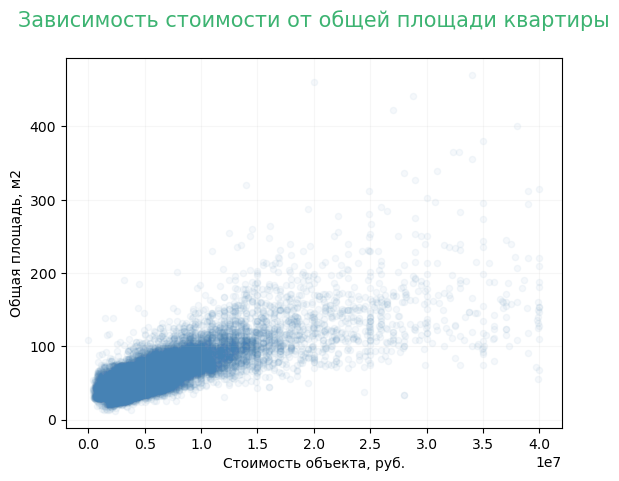

In [105]:
# Рассмотрим диаграмму рассеяния для оценки влияния общей площади на цену объекта
factors_price.plot(x='last_price' ,
                   y='total_area',
                   kind='scatter',
                   color='SteelBlue',
                   alpha=0.05)

plt.ylabel('Общая площадь, м2')
plt.xlabel('Стоимость объекта, руб.')
plt.title('Зависимость стоимости от общей площади квартиры' + '\n',  fontsize=15, color='mediumseagreen')
plt.grid(alpha=0.1)
plt.show()

**Выводы:**
- Диаграмма рассеяния подтверждает положительную сильную линейную зависимость между ценой объекта и общей площадью;
- до 15 млн - прослеживается наибольшая корреляция, с увеличением стоимости объекта связь ослабевает (вероятно наибольшее влияние оказывает другой значимый фактор). 

**`living_area`**

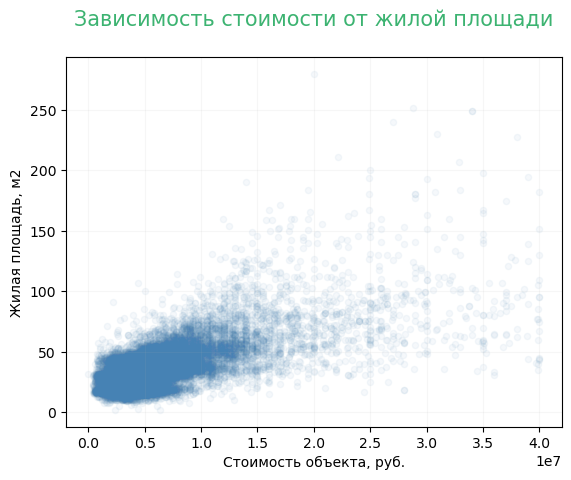

In [106]:
# Рассмотрим диаграмму рассеяния для оценки влияния жилой площади на цену объекта
factors_price.plot(x='last_price' ,
                   y='living_area',
                   kind='scatter',
                   color='SteelBlue',
                   alpha=0.05)

plt.ylabel('Жилая площадь, м2')
plt.xlabel('Стоимость объекта, руб.')
plt.title('Зависимость стоимости от жилой площади' + '\n',  fontsize=15, color='mediumseagreen')
plt.grid(alpha=0.1)
plt.show()

**Выводы:**
- Диаграмма рассеяния подтверждает положительную сильную линейную зависимость между ценой объекта и жилой площадью;
- до 15 млн - прослеживается наибольшая корреляция, с увеличением стоимости объекта связь ослабевает (вероятно наибольшее влияние оказывает другой значимый фактор).

**`kitchen_area`**

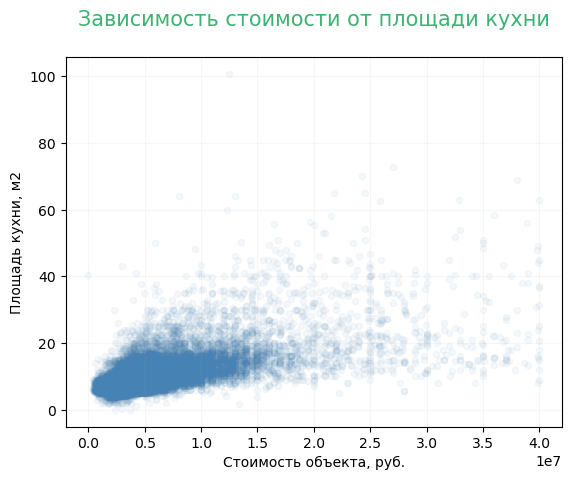

In [107]:
# Рассмотрим диаграмму рассеяния для оценки влияния площади кухни на цену объекта
factors_price.plot(x='last_price' ,
                   y='kitchen_area',
                   kind='scatter',
                   color='SteelBlue',
                   alpha=0.05)

plt.ylabel('Площадь кухни, м2')
plt.xlabel('Стоимость объекта, руб.')
plt.title('Зависимость стоимости от площади кухни' + '\n',  fontsize=15, color='mediumseagreen')
plt.grid(alpha=0.1)
plt.show()

**Выводы:**
- Диаграмма рассеяния подтверждает положительную среднюю линейную зависимость между ценой объекта и жилой площадью (однако данный фактор менее значим, чем общая площадь, т.к. больше вариативность разброса значений);
- до 15 млн - прослеживается наибольшая корреляция, с увеличением стоимости объекта связь ослабевает (вероятно наибольшее влияние оказывает другой значимый фактор).

**`rooms`**

In [108]:
# Создадим сводную таблицу по данным о количестве комнат и стоимости объекта
rooms_price = factors_price.pivot_table(index='rooms', values='last_price', aggfunc=['min', 'median', 'max', 'count'])
rooms_price.columns=['min_price', 'median_price', 'max_price', 'count']
rooms_price

,min_price,median_price,max_price,count
rooms,,,,
0,945750,2700000,16300000,195
1,430000,3600000,39900000,8001
2,12190,4770338,39900000,7871
3,550000,6155000,40000000,5714
4,999000,8900000,40000000,1126
5,1650000,12900000,40000000,289
6,4390000,16950000,40000000,88
7,7900000,22000000,38000000,43


In [109]:
# Построим столбчатый график, отражающий влияние количества комнат на цену
fig = go.Figure()

# Добавим столбчатый график с минимальной ценой
fig.add_trace(
    go.Bar(x=rooms_price.index,
           y=rooms_price['min_price'],
           name='Минимальная цена'
          )
)

# Добавим столбчатый график с медианной ценой
fig.add_trace(
    go.Bar(x=rooms_price.index,
           y=rooms_price['median_price'],
           name='Медианная цена'
          )
)

# Добавим столбчатый график с максимальной ценой
fig.add_trace(
    go.Bar(x=rooms_price.index,
           y=rooms_price['max_price'],
           name='Максимальная цена'
          )
)

fig.update_layout(title_text='Зависимоcть цены объекта от количества комнат',
                  xaxis_title_text='Количество комнат',
                  yaxis_title_text='Цена квартиры, млн руб.',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.2,
                  bargroupgap=0.1
                 )
fig.show()

Столбчатый график отражает прямую зависимость между минимальной и медианной ценой с количеством комнат, однако на максимальную цену данный фактор не оказывает влияния.

Для более точного вывода построим диаграмму рассеяния:

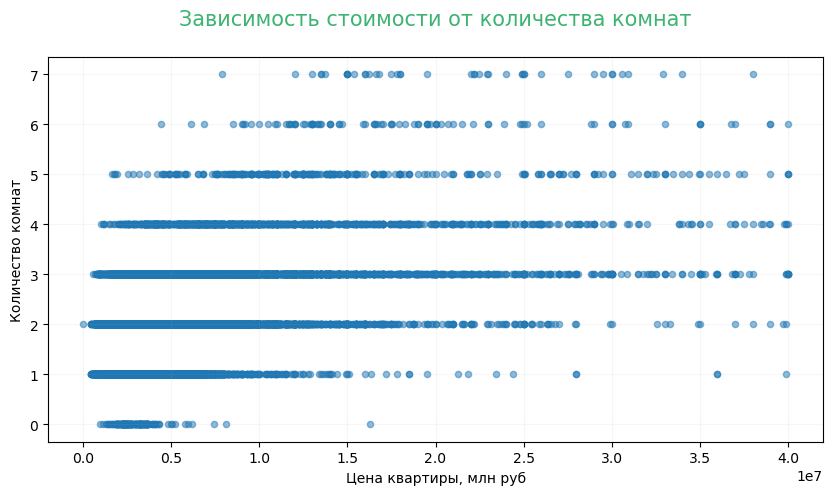

In [110]:
# Рассмотрим диаграмму рассеяния для оценки влияния количества комнат на цену объекта
factors_price.plot(x='last_price',
                   y='rooms',
                   kind='scatter',
                   alpha=0.5,
                   figsize=(10, 5))

plt.ylabel('Количество комнат')
plt.xlabel('Цена квартиры, млн руб')
plt.title('Зависимость стоимости от количества комнат' + '\n',  fontsize=15, color='mediumseagreen')
plt.grid(alpha=0.1)
plt.show()

**Выводы:**
- Столбчатый график подтверждает сильную положительную линейную зависимость между минимальной/медианной ценой объекта и количеством комнат, однако максимальная цена демонстрирует иное;
- Диаграмма рассеяния демонстрирует корреляцию между факторами, однако слишком большой разброс значений говорит о средней зависимости (что соотвествует коэффициенту Пирсона в 51%).

**`type_floor`**

In [111]:
# Создадим сводную таблицу по данным о типе этажа и стоимости объекта
floor_price = factors_price.pivot_table(index='type_floor', values='last_price', aggfunc=['min', 'median', 'max', 'count'])
floor_price.columns=['min_price', 'median_price', 'max_price', 'count']
floor_price

,min_price,median_price,max_price,count
type_floor,,,,
другой,450000,4800000,40000000,17118
первый,430000,3900000,38000000,2882
последний,12190,4300000,40000000,3327


In [112]:
# Построим столбчатый график, отражающий влияние типа этажа  на цену
fig = go.Figure()

# Добавим столбчатый график с минимальной ценой
fig.add_trace(
    go.Bar(x=floor_price.index,
           y=floor_price['min_price'],
           name='Минимальная цена'
          )
)

# Добавим столбчатый график с медианной ценой
fig.add_trace(
    go.Bar(x=floor_price.index,
           y=floor_price['median_price'],
           name='Медианная цена'
          )
)

# Добавим столбчатый график с максимальной ценой
fig.add_trace(
    go.Bar(x=floor_price.index,
           y=floor_price['max_price'],
           name='Максимальная цена'
          )
)

fig.update_layout(title_text='Зависимоcть цены объекта от типа этажа ',
                  xaxis_title_text='Тип этажа ',
                  yaxis_title_text='Цена квартиры, млн руб.',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  bargap=0.2,
                  bargroupgap=0.1
                 )
fig.show()

Столбчатый график демонстрирует зависимость стоимости объекта от типа этажа:
  - на первом этаже квартиры дешевле всего;
  - на последнем этаже квартиры дороже, чем на первом этаже (однако минимальная цена именно за квартиру на последнем этаже);
  - на других этажах - самые дорогие квартиры (однако самые дорогие могут располагаться и на последних этажах - вероятно в случае пентхаусов).

Для более точного вывода построим диаграмму рассеяния:

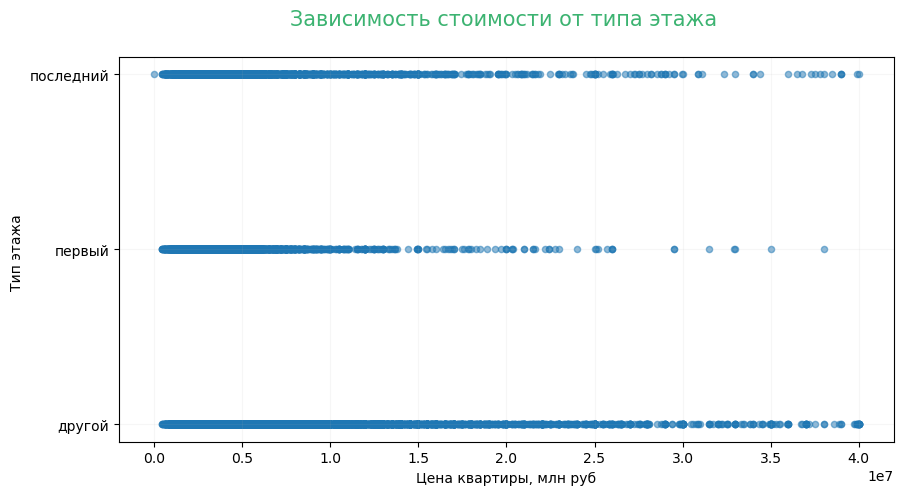

In [113]:
# Рассмотрим диаграмму рассеяния для оценки влияния типа этажа на цену объекта
factors_price.plot(x='last_price',
                   y='type_floor',
                   kind='scatter',
                   alpha=0.5,
                   figsize=(10, 5))

plt.ylabel('Тип этажа ')
plt.xlabel('Цена квартиры, млн руб')
plt.title('Зависимость стоимости от типа этажа ' + '\n',  fontsize=15, color='mediumseagreen')
plt.grid(alpha=0.1)
plt.show()

**Выводы:**

Диаграмма рассеяния подтверждает выводы, сделанные раннее. Зависимость прослеживается, но нельзя сказать о положительной линейной зависимости, т.к. слишком большой разброс значений:
- на первом этаже самые недорогие квартиры (от 430 тыс. руб. до примерно 1,5 млн, искл. единичные значения);
- на последнем этаже чаще всего квартиры либо такой же стоимости, либо дороже (от 430 тыс. руб. до 2 млн, искл. единичные значения);
- на других этажах самые дорогие квартиры, однако стоимость сильно варьируется, т.к. категория включает в себя значительно большую выборку от 2 до 32 этажа в случае небоскреба (от 450 тыс. руб. до примерно 3,5 млн, искл. единичные значения).

**`weekday_exposition`**

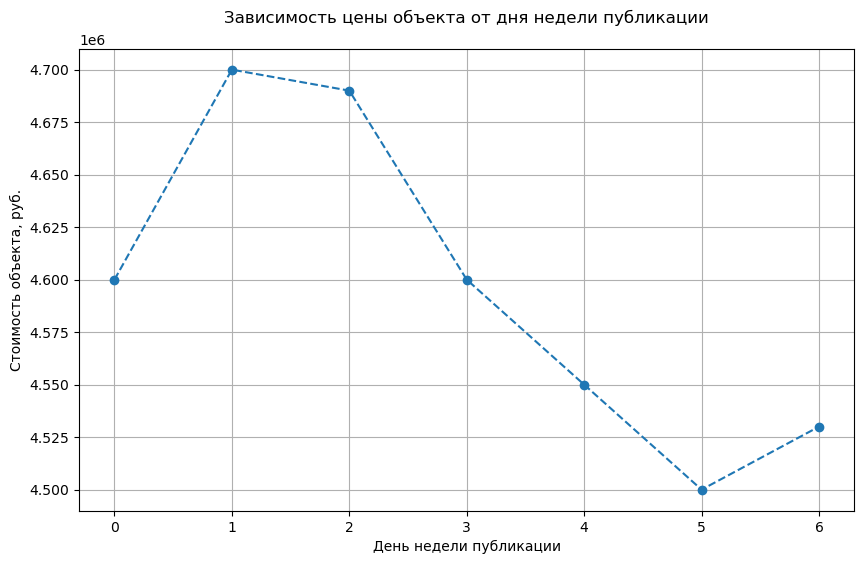

In [114]:
# Рассмотрим график для оценки влияния дня недели публикации объявления на цену объекта
(factors_price
 .pivot_table(index='weekday_exposition', values='last_price', aggfunc='median')
 .plot(figsize=(10, 6),
       style='--o',
       grid=True,
       title='Зависимоcть цены объекта от дня недели публикации' + '\n',
       xlabel='День недели публикации',
       ylabel='Стоимость объекта, руб.',
       legend=False,
       rot=0,
       )
);

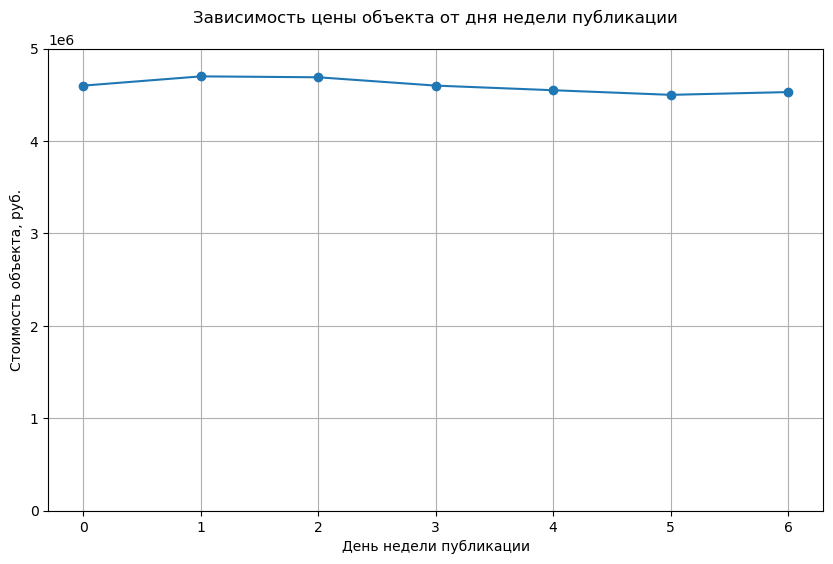

In [115]:
# Восстановим ось по Y
(factors_price
 .pivot_table(index='weekday_exposition', values='last_price', aggfunc='median')
 .plot(figsize=(10, 6),
       style='-o',
       grid=True,
       title='Зависимоcть цены объекта от дня недели публикации' + '\n',
       xlabel='День недели публикации',
       ylabel='Стоимость объекта, руб.',
       legend=False,
       ylim=(0, 5000000),
       rot=0,
       )
);

**Выводы:**

При восстановлении оси Y линейный график потверждает отсутствие влияния дня недели публикации объявления на цену объекта, однако на первом графике можно отметить незначительное нелинейное влияние дня недели публикации на медианную цену объекта в диапазоне цен от 4,5 млн до 4,7 млн:
   - во вторник наблюдаются самые дорогие публикации;
   - в выходные дни публикуются самые дешевые квартиры;
   - со вторника по субботу стоимость публикуемого объекта неуклонно снижается (-200 тыс руб, что составляет понижение на 4,25%).

**`month_exposition`**

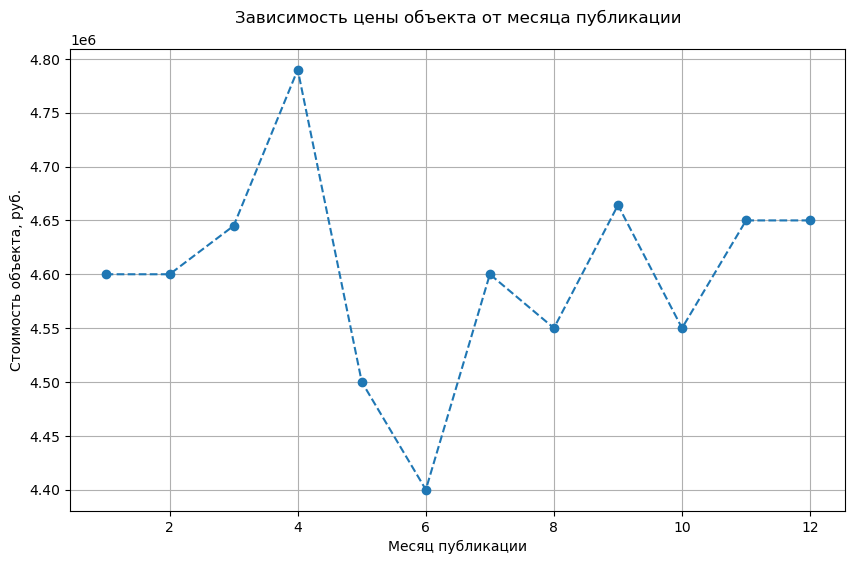

In [116]:
# Рассмотрим график для оценки влияния месяца публикации объявления на цену объекта
(factors_price
 .pivot_table(index='month_exposition', values='last_price', aggfunc='median')
 .plot(figsize=(10, 6),
       style='--o',
       grid=True,
       title='Зависимоcть цены объекта от месяца публикации' + '\n',
       xlabel='Месяц публикации',
       ylabel='Стоимость объекта, руб.',
       legend=False,
       rot=0)
);

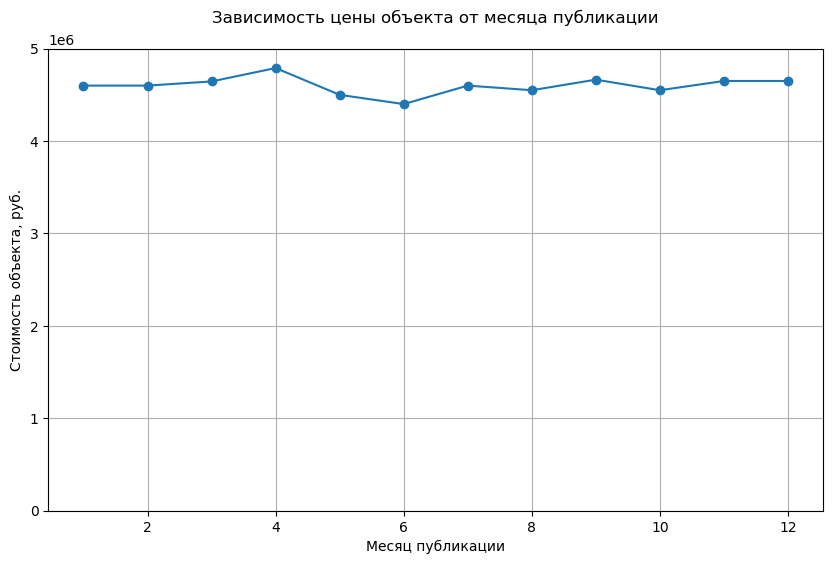

In [117]:
# Восстановим ось по Y
(factors_price
 .pivot_table(index='month_exposition', values='last_price', aggfunc='median')
 .plot(figsize=(10, 6),
       style='-o',
       grid=True,
       title='Зависимоcть цены объекта от месяца публикации' + '\n',
       xlabel='Месяц публикации',
       ylabel='Стоимость объекта, руб.',
       legend=False,
       ylim=(0, 5000000),
       rot=0)
);

**Выводы:**
    
При восстановлении оси Y линейный график подтверждает отсутствие влияния месяца публикации объявления на цену объекта, однако на первом графике можно отметить незначительное нелинейное влияние месяца публикации на медианную цену объекта в диапазоне цен от 4,35 млн до 4,8 млн:
   - в апреле наблюдаются самые дорогие публикации;
   - в июне публикуются самые дешевые квартиры (примерно на 400 тыс руб меньше максимальной цены, что составляет понижение на 8,42%);
   - с января по март цены на квартиры находятся в стагнации (на одном уровне);
   - с июля по декабрь стоимость квартир находится в диапозоне от 4,55 млн до 4,65 млн;
   - с марта по апрель и с июня по июль наблюдается резкий рост стоимости жилья (+150 тыс руб. и +210 тыс руб соответственно).

**`year_exposition`**

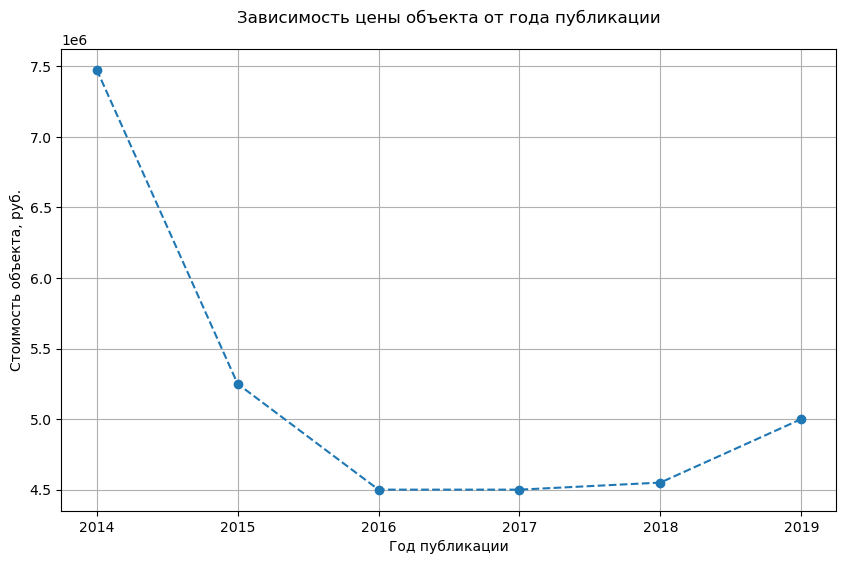

In [118]:
# Рассмотрим столбчатый график для оценки влияния года публикации объявления на цену объекта
(factors_price
 .pivot_table(index='year_exposition', values='last_price', aggfunc='median')
 .plot(figsize=(10, 6),
       style='--o',
       grid=True,
       title='Зависимоcть цены объекта от года публикации' + '\n',
       xlabel='Год публикации',
       ylabel='Стоимость объекта, руб.',
       legend=False,
       rot=0)
);

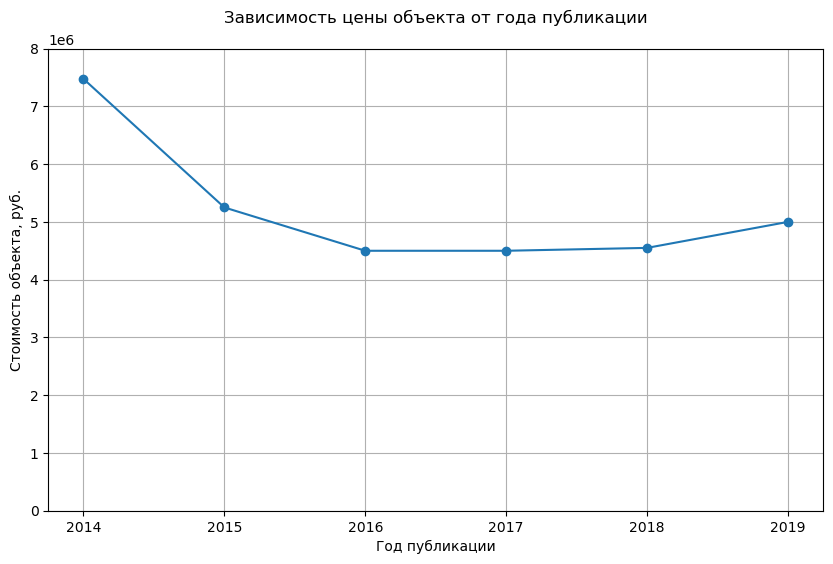

In [119]:
# Восстановим ось по Y
(factors_price
 .pivot_table(index='year_exposition', values='last_price', aggfunc='median')
 .plot(figsize=(10, 6),
       style='-o',
       grid=True,
       title='Зависимоcть цены объекта от года публикации' + '\n',
       xlabel='Год публикации',
       ylabel='Стоимость объекта, руб.',
       legend=False,
       ylim=(0, 8000000),
       rot=0)
);

**Выводы:**

Линейный график подтверждает отсутствие линейной зависимости, но демонстриует нелинейную зависимость между годом публикации объявления и ценой объекта:
    - с 2014 по 2016 года - наблюдается снижение цен на 3 млн руб (-40% от стоимости 2014 года),
    - с 2016 по 2018 года - наблюдается стагнация цен (цена находится примерно на одном уровне),
    - с 2018 года - наблюдается повышение цен на 0,5 млн руб (+11% от стоимости 2018 года);
- В 2014 году цены на квартиры самые высокие - около 7,5 млн (в 1,5 раза больше, чем в период стагнации);
- В период стагнации цены на квартиры самые низкие - около 4,5 млн.

**Итоги изучения влияния параметров на стоимость объекта:**
- наиболее значимым фактором является общая площадь квартиры - наиболее сильная линейная зависимость между ценой объекта и общей площадью (корреляция 78,5%);
- диаграммы рассеяния подтверждают значимое влияние общей и жилой площади, а также площади кухни;
- столбчатый график и диаграмма рассеяния демонстрирует корреляцию между факторами, однако слишком большой разброс значений говорит о средней зависимости (корреляция 51%), что объясняется увеличением площади объекта;
- столбчатый график и диаграмма рассеяния демонстрируют среднюю зависимость между ценой объекта и типом этажа, что объясняется условиями проживания:
    - квартиры на первом этаже самые дешевые, т.к. имеют худшие условия: чаще подвергаются затоплениям, шум от улиц и моторов лифта;
    - квартиры на последнем этаже также обладают плохими условиями: охлаждаемость помещения зимой, сырость;
    - квартиры на других этажах более дорогие, т.к. обладают наилучшими условиями.
- слабая корреляция обнаружена для даты публикации объявления (день недели и месяц), однако наблюдается нелинейная зависимость от года публикации, т.к. данный фактор показывает привлекательность и актуальность жилья в заивисмости от макроэконочисеких и политических изменений в стране и мире.

### Расчет средней цены одного квадратного метра

In [120]:
#Рассчитаем среднюю цену одного квадратного метра в 10 населённых пунктах с наибольшим числом объявлений
(data
 .pivot_table(index='locality_name', values='price_per_area', aggfunc=['mean', 'count'])
 .sort_values(by=('count', 'price_per_area'), ascending=False)
 .head(10)
 .sort_values(by=('mean', 'price_per_area'), ascending=False)
)

,mean,count
,price_per_area,price_per_area
locality_name,,
Санкт-Петербург,111626.621333,15447
Пушкин,103054.545000,364
деревня Кудрово,92473.547559,299
поселок Парголово,90205.423374,326
поселок Мурино,85681.762572,556
поселок Шушары,78677.364318,440
Колпино,75352.475595,336
Гатчина,68746.146515,307


**Выводы:**
- Санкт-Петербург - самый популряный город для продажи квартиры (~ 66% объявлений);
- Населённые пункты с самой высокой стоимостью квадратного метра (от 90 тыс руб. до 112 тыс руб.):
    - Санкт-Петербург - 111,63 тыс руб.
    - Пушкин - 103,05 тыс руб. (- 7,69% от наибольшей)
    - деревня Кудрово - 92,47 тыс руб. (- 17,16% от наибольшей)
    - поселок Парголово - 90,21 тыс руб. (- 19,19% от наибольшей)
- Населённые пункты с самой низкой стоимостью квадратного метра (от 58 тыс руб. до 69 тыс руб.):
    - Выборг - 58,19 тыс руб.
    - Всеволожск - 68,67 тыс руб. (+ 18% к наименьшей)
    - Гатчина - 68,75 тыс руб. (+ 18.15% к наименьшей)

### Изучение влияния удаленности от центра Санкт-Петербурга на стоимость квартир

In [121]:
# Выделим данные только по Санкт-Петербургу
data_spb = data.query('locality_name == "Санкт-Петербург"')

# Рассчитаем коэффициент корреляции
data_spb['last_price'].corr(data_spb['city_centers_nearest_km'].astype(float))

-0.4021743958401649

- Коэффициент корреляции между стоимостью объекта и его удаленностью от центра Санкт-Петербурга отрицательный, т.к. цены повышается, когда расстояние до центра города становится меньше;
- Коэффициент корреляции равняется 40,22% - зависимость есть, но незначительная, либо она сложнее, чем линейная.

In [122]:
# Создадим сводную таблицу по данным Санкт-Петербурга для определения зависимости 
# между стоимостью квартиры и удаленности от центра города
mean_price_km_spb = data_spb.pivot_table(index='city_centers_nearest_km', values='last_price', aggfunc=['mean', 'count'])
mean_price_km_spb['mean', 'last_price'] = mean_price_km_spb['mean', 'last_price'].astype(int)
mean_price_km_spb.columns = ['mean_price', 'count']
mean_price_km_spb

,mean_price,count
city_centers_nearest_km,,
0.0,17158753,18
1.0,12541167,173
2.0,11645379,279
3.0,10118701,340
4.0,10936666,664
5.0,11408265,875
6.0,10909907,571
7.0,10663561,388
8.0,9018717,587


In [123]:
# Рассмотрим зависимость между стоимостью квартиры и удаленностью от центра города
fig = go.Figure()

fig.add_trace(
    go.Scatter(y=mean_price_km_spb['mean_price'], 
               mode='lines+markers'
              )
)

fig.update_layout(title_text='Средняя цена каждого километра от центра Санкт-Петербурга',
                  xaxis_title_text='км от центра города',
                  yaxis_title_text='Средняя цена',
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)',
                  )
fig.show()

**Вывод:**
- Коэффициент корреляции указывает на слабую отрицательную корреляцию между стоимостью объекта и его удаленностью от центра Санкт-Петербурга (-40,22%);
- График демонстрирует, что удаленность от центра Санкт-Петербурга - значимый фактор для определения стоимости объекта, т.к. наблюдается неуклонное снижение цены при росте расстояния от центра города (небольшой рост в районе 4-5 км не учитвается, т.к. это возможный центр города). Исключение составляет 20 и 27 км (резкий скачок цены), но вероятно такие пики связан с малым количеством наблюдений (48 по 20 км и всего 2 строки по 27 км). Вероятно, что из-за данных исключений, коэффициент Пирсона занижен.

## Общий вывод

В ходе проведенного исследования о влиянии различных факторов на стоимость объекта недвижимости была выполнена первичная предобработка данных и их исследовательский анализ для выявления интересных особенностей и зависимостей, которые существуют на рынке недвижимости.

*Входные данные:* архив объявлений о продаже квартир в Санкт-Петербурге и соседних населённых пунктов, размещенных на площадке сервиса Яндекс.Недвижимость, за несколько лет.

По каждой квартире доступна следующая информация:
- пользовательские данные, заполненные вручную (площадь квартиры, этаж, число комнат и т.п.)
- картографические данных, полученные автоматически (например, расстояние до центра, аэропорта, ближайшего парка и водоёма)
- данные сервиса о публикации (дата публикации, количество дней размещения объявления)

*Результаты исследования:*
- рекомендации для построения более точной модели рыночной стоимости объектов недвижимости, которая позволит отследить аномалии и мошенническую деятельность при публикации объявлений пользователями.

**Итоги первичной предобработки данных:**

1. В ходе *обработки пропусков* в 16 из 22 столбцов таблицы выявлены и обработаны пропуски за исключением следующих случаев:
   - невозможно восстановить название населенного пункта, т.к. от центра города на одинаковом расстоянии могут находиться несколько населенных пунктов с учетом сторон света, поэтому строки удалены;
   - расстояние до ближайшего парка/водоема в радиусе 3 км невозможно заполнить, т.к. парков/водоемов в указанном радиусе нет, (поставлено значение по умолчанию "-1");
   - количество дней публикации нельзя заполнить, т.к. вероятно объявления еще не сняты с публикации;
   - расстояния до ближайшего аэропорта и центра города частисно остались не заполнены, т.к. данных по поселкам и отдаленным городам нет совсем для заполнения меданным значением по населенному пункту.
   
2. В ходе *изменения типов данных* обнаружены и скорректированы следующие типы данных столбцов:
   - `floors_total`, `balcony`, `parks_around3000`, `ponds_around3000` приведены к целым числам;
   - `first_day_exposition` приведен к дате и времени;
   - `is_apartment` приведен к типу булева.
- при необходимости в целях экономии памяти возможно изменение следующих типов данных:
    - float64 на float32, т.к. для исследования достаточно 4 байт памяти;
    - int62 на int32, т.к. в исследовании не используются очень большие или очень маленькие числа.
    
3. В ходе *обработки дублирующих значений* явных дубликатов строк не выявлено, однако выявлены и заменены все неявные дубликаты наименований населенных пунктов.

4. В ходе *обработки аномальных значений* были рассмотрены все числовые столбцы таблицы на предмет выбросов и скорректированы следующие значения:
    - данные о высоте потолков согласно гипотезе, что в данных есть ошибка и значение 20 м - это 2.0 м и т.д.;
    - нормальными значениями высоты потолков признаны значения в диапозоне от 2,5 м до 4 м, строки с аномально низкими и высокими значениями удалены;
    - нормальными значениями стоимости объектов недвижимости признаны значения до 40 млн руб., строки с аномально высокими значениями удалены, т.к. данные могут исказить результаты.

*Рекомендации*: 
- проверить алгоритм заполнения данных согласно выявленным ошибкам;
- проверить алгоритм получения картографических данных, т.к. в них наблюдается большое количество пропусков;
- проверить неявные дубликаты в населенных пунктах и устранить ошибки записи;
- для экономии памяти скорректировать числовые типы данных.

**Особенности рынка недвижимости:**

В ходе исследовательского анализа данных выявлены следующие особенности:

*Длительность продажи квартиры:*
- в среднем продажа квартиры занимает полгода, однако медианное значение гораздо меньше - 1,5 месяца, т.к. выборка имеет положительную скошенность с длинным хвостом;
- быстрой продажей можно считать продажу квартиры от 1 до 70 дней;
- медленной продажей можно считать продажу квартиры более 500 дней, а необычайно медленной - более 1000 дней.

*Стоимость квадратного метра:*
- Населённые пункты с самой высокой стоимостью квадратного метра (от 90 тыс руб. до 112 тыс руб.):
    - Санкт-Петербург - 111,63 тыс руб.
    - Пушкин - 103,05 тыс руб. (- 7,69% от наибольшей)
    - деревня Кудрово - 92,47 тыс руб. (- 17,16% от наибольшей)
    - поселок Парголово - 90,21 тыс руб. (- 19,19% от наибольшей)
- Населённые пункты с самой низкой стоимостью квадратного метра (от 58 тыс руб. до 69 тыс руб.):
    - Выборг - 58,19 тыс руб.
    - Всеволожск - 68,67 тыс руб. (+ 18% к наименьшей)
    - Гатчина - 68,75 тыс руб. (+ 18.15% к наименьшей)
   
*Параметры объектов недвижимости:*
- на рынке преобладают данные по 1-комнатным и 2-комнатным квартирам, в 1,5 раза меньше данных по 3-комнатным квартирам;
- почти половина квартир имеют среднее значений высоты потолка 2,65 м;
- около 25% рынка - квартиры в 5-этажных домах, около 16% - квартиры в 9-этажных домах;
- около 10% квартир находятся на первом этаже, соответсвующее количество на последнем;
- диапазон 11000-16000 м от центра города - наиболее популярный среди публикаций.

*Дата размещения публикации:*
- объявления в будние дни публикуют в два раза чаще, чем в выходные;
- май - самый редкий месяц публикации объявлений, тогда как февраль и март - самые популярные месяца для публикации.

**Факторы, влияющие на стоимость объектов недвижимости:**

В ходе исследовательского анализа данных выявлены следующие факторы, влияющие на стоимость объектов:
- наиболее значимыми факторами являются общая и жилая площади квартиры - высокая линейная зависимость (коэффициент корреляции 0,8 и 0,7 соответственно, также подтверждается диаграммой рассеяния);
- влияние средней силы оказывают площадь кухни (коэффициент корреляции 0,6, также подтверждается диаграммой рассеяния) и количеством комнат, что подтверждается увеличением общей и жилой площади квартиры (коэффициент корреляции 0,5, т.к. связь нелинейная, а более сложная);
- прослеживается зависимость, однако более сложная, чем линейная, между ценой объекта и типом этажа, что объясняется условиями проживания:
    - квартиры на первом этаже самые дешевые, т.к. имеют худшие условия: чаще подвергаются затоплениям, шум от улиц и моторов лифта;
    - квартиры на последнем этаже также обладают плохими условиями: охлаждаемость помещения зимой, сырость - однако могут быть и пентхаусами с отличными условиями;
    - квартиры на других этажах более дорогие, т.к. обладают наилучшими условиями и имеют большой разброс значений выборки: от 2 до 32 этажа в случае небоскреба.
- очень слабая корреляция обнаружена для даты публикации объявления (день недели и месяц): изменение стоимости объекта на 4-8%;
- нелинейная высокая зависимость наблюдается от года публикации: колебание цен до 40%,  т.к. данный фактор показывает привлекательность и актуальность жилья в заивисмости от макроэконочисеких и политических изменений в стране и мире;
- удаленность от центра Санкт-Петербурга - значимый фактор для определения стоимости объекта, т.к. наблюдается неуклонное снижение цены при росте расстояния от центра города (отрицательная корреляция). Исключение составляет 20 и 27 км (резкий скачок цены), но вероятно такие пики связаны с малым количеством наблюдений (48 по 20 км и всего 2 строки по 27 км).

*Рекомендации*: провести дополнительное исследование зависимости стоимости квартиры и удаленности от центра Санкт-Петербурга (мало данных о стоимости объектов, расположенных от центра города в 20 км и больше).

**Общие рекомендации:**
- Проверить алгоритм заполнения данных согласно выявленным ошибкам на этапе предобработки данных;
- Провести дополнительное исследование зависимости стоимости квартиры и удаленности от центра Санкт-Петербурга;
- Учесть в модели рыночной стоимости объектов недвижимости факторы, оказывающие высокое вляиние и влияние средней силы.